### Установка

In [8]:
!git clone https://github.com/uivvyd/Diffusion-samplers-for-TSF.git

Cloning into 'Diffusion-samplers-for-TSF'...
remote: Enumerating objects: 949, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (210/210), done.
remote: Total 949 (delta 346), reused 253 (delta 253), pack-reused 485 (from 2)
Receiving objects: 100% (949/949), 9.15 MiB | 609.00 KiB/s, done.
Resolving deltas: 100% (556/556), done.


In [1]:
%cd Diffusion-samplers-for-TSF

/workdir/Diffusion-samplers-for-TSF


/home/mlcore/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
!ls

checkpoints	    docs      notebook	      results	    scripts
CODE_OF_CONDUCT.md  exps      probts	      run.py	    SECURITY.md
config		    LICENSE   pyproject.toml  run.sh	    submodules
datasets	    __MACOSX  README.md       samplers_res


In [4]:
!sudo apt-get install zip unzip -y

sudo: unable to open log file /run/ml-core-sys/sudo.log: Permission denied
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
zip is already the newest version (3.0-12build2).
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 2 not upgraded.
Need to get 175 kB of archives.
After this operation, 386 kB of additional disk space will be used.
Get:1 http://repo-linux.tcsbank.ru/ubuntu jammy-updates/main amd64 unzip amd64 6.0-26ubuntu3.2 [175 kB]
Fetched 175 kB in 0s (507 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
Selecting previously unselected package unzip.
(Reading database ... 22918 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-26ubuntu3.2_am

In [11]:
!unzip datasets/all_six_datasets.zip

Archive:  datasets/all_six_datasets.zip
   creating: all_six_datasets/
   creating: all_six_datasets/traffic/
  inflating: __MACOSX/all_six_datasets/._traffic  
  inflating: all_six_datasets/.DS_Store  
  inflating: __MACOSX/all_six_datasets/._.DS_Store  
   creating: all_six_datasets/illness/
  inflating: __MACOSX/all_six_datasets/._illness  
   creating: all_six_datasets/ETT-small/
  inflating: __MACOSX/all_six_datasets/._ETT-small  
   creating: all_six_datasets/weather/
  inflating: __MACOSX/all_six_datasets/._weather  
   creating: all_six_datasets/exchange_rate/
  inflating: __MACOSX/all_six_datasets/._exchange_rate  
   creating: all_six_datasets/electricity/
  inflating: __MACOSX/all_six_datasets/._electricity  
  inflating: all_six_datasets/traffic/.DS_Store  
  inflating: __MACOSX/all_six_datasets/traffic/._.DS_Store  
  inflating: all_six_datasets/traffic/traffic.csv  
  inflating: all_six_datasets/illness/national_illness.csv  
  inflating: all_six_datasets/ETT-small/ETTh1.

In [12]:
import shutil
import os
import argparse

def move_files_up_one_level(directory):
    for item in os.listdir(directory):
        if item in ['__MACOSX', '.DS_Store', 'all_datasets.zip']:
            continue 
        s = os.path.join(directory, item)
        d = os.path.join(os.path.dirname(directory), item)
        if not os.path.exists(d):
            shutil.move(s, d)
        else:
            print(f"skip {item} due to file exist")
            delete_path(s)
    
    try:
        delete_path(directory)
    except:
        print(f'cannot delete {directory}, skip...')
    
def cleanup_directory(directory):
    for root, dirs, files in os.walk(directory):
        for name in dirs:
            if name in ['__MACOSX']:
                shutil.rmtree(os.path.join(root, name))
                
        for name in files:
            if name in ['.DS_Store', 'all_datasets.zip']:
                os.remove(os.path.join(root, name))

def delete_path(path):
    if os.path.exists(path):
        if os.path.isfile(path):
            os.remove(path)
        elif os.path.isdir(path):
            shutil.rmtree(path)
                
move_files_up_one_level('datasets/all_six_datasets')              

In [5]:
!pip install lightning

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 21.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 116.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 15.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 23.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 173.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 160.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 115.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 92.8 MB/

In [6]:
!pip install gluonts

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 95.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.9/443.9 kB 176.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 46.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 208.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [7]:
!pip install dotenv

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [8]:
!pip install reformer-pytorch

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 3.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [9]:
!pip install linear-attention-transformer

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [10]:
!pip install utilsforecast

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.8 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [11]:
!pip install transformers 

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 112.3 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.2/484.2 kB 100.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 160.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 175.0 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [12]:
!pip install jax

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 42.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 MB 79.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 49.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 164.5 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [13]:
!pip install scikit-learn

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 202.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 101.1 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from probts.model.forecaster import LinearForecaster, NaiveForecaster, TSDiffCond, TimeGrad
from probts.model.forecast_module import ProbTSForecastModule
from probts.data import ProbTSDataModule, DataManager, ProbTSBatchData
from probts.utils import find_best_epoch
from lightning import Trainer
import torch
import matplotlib.pyplot as plt

In [4]:
import pytorch_lightning as pl
pl.seed_everything(0)

Seed set to 0


0

In [5]:
import warnings
warnings.filterwarnings("ignore")

## TimeGrad, ETTh

In [6]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [21]:
import matplotlib.pyplot as plt
import numpy as np

def forecast_and_visualize(batch, model, num_chan=10, num_samples=100, batch_idx=0, context_length=96, prediction_length=96):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)

    with torch.no_grad():
        prediction = model.forecaster.forecast(batch_data, num_samples=num_samples)
        prediction = model.scaler.inverse_transform(prediction).cpu()
    prediction = prediction[batch_idx]

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    q05 = np.quantile(prediction, 0.05, axis=0)
    q25 = np.quantile(prediction, 0.25, axis=0)
    q75 = np.quantile(prediction, 0.75, axis=0)
    q95 = np.quantile(prediction, 0.95, axis=0)
    avg = prediction.mean(axis=0)
    med = np.quantile(prediction, 0.5, axis=0)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, avg[:, i], color='orange', label='average forecasts')
        ax.fill_between(future_range, q05[:, i], q95[:, i], color='orange', alpha=.4, label='interval:0.9')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()
        
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, med[:, i], color='green', label='median forecasts')
        ax.fill_between(future_range, q25[:, i], q75[:, i], color='green', alpha=.4, label='interval:0.5')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()

In [7]:
import time

def time_for_forecast(batch, model, n_repeats=10):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    total_time = 0

    for i in range(n_repeats):
        start_time = time.time()
        with torch.no_grad():
            prediction = model.forecaster.forecast(batch_data, num_samples=1)
        total_time += (time.time() - start_time)
    total_time /= n_repeats
    return total_time

In [8]:
from tqdm import tqdm

def check_metrics_for_samplers(test_dataloader, model, trainer, steps):
    metrics = []
    for num_steps in tqdm(steps):
        model.forecaster.prob_model.solver_num_steps = num_steps
        res = trainer.test(model=model, dataloaders=test_dataloader)
        metrics += res
    return metrics

In [65]:
data_manager = DataManager(
    dataset='etth1',
    path='datasets',
    context_length=96,
    prediction_length=96,
    scaler='standard',
)

data_module = ProbTSDataModule(
    data_manager=data_manager,
    batch_size=8,
    test_batch_size=8,
    num_workers=8,
)
test_dataloader = data_module.test_dataloader()

Loading Long-term Dataset: etth1
val  pred_len: 96 : num_test_windows: 29
test  pred_len: 96 : num_test_windows: 29
Test context length: [96], prediction length: [96]
Validation context length: [96], prediction length: [96]
Training context length: [96], prediction lengths: [96]
Test rolling length: 96
Variable-specific normalization: True


In [67]:
forecaster = TimeGrad(
    use_lags=True,
    use_feat_idx_emb=True,
    use_time_feat=True,
    target_dim=data_manager.target_dim,
    context_length=data_manager.context_length,
    prediction_length=data_manager.prediction_length,
    freq=data_manager.freq,
    lags_list=data_manager.lags_list,
    time_feat_dim=data_manager.time_feat_dim,
    dataset=data_manager.dataset,


      loss_type='l2',
      diff_steps=500,
      beta_end=0.1,
      beta_schedule='linear',
      conditional_length=200,
      enc_hidden_size=64,
      enc_num_layers=4,
      enc_dropout=0.1,
      feat_idx_emb_dim=1,
      use_scaling=True

)

model = ProbTSForecastModule(
    forecaster=forecaster,
    scaler=data_manager.scaler,
    learning_rate=0.001,
    quantiles_num=20,
)
model = model.load_from_checkpoint('../etth1_timegrad_epoch=69-step=7000.ckpt')

sampling_weight_scheme: none
sampling_weight_scheme: none


In [68]:
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    strategy="auto",
    max_epochs=50,
    use_distributed_sampler=False,
    limit_train_batches=100,
    log_every_n_steps=1,
    accumulate_grad_batches=1,
    default_root_dir='./results',
  check_val_every_n_epoch= 1,
  gradient_clip_val=0.5
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### DDPM

In [69]:
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver = 'ddpm'
model.forecaster.prob_model.solver_num_steps = 500
model.forecaster.prob_model.solver_schedule = 'linear'

In [70]:
for batch in test_dataloader:
    break

time_for_forecast(batch, model, n_repeats=1)

116.54657340049744

In [72]:
res = trainer.test(model=model, dataloaders=test_dataloader);

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5118424892425537
    96_test_CRPS-Sum        0.3401552438735962
      96_test_MASE           4.473731517791748
       96_test_MSE          24.335926055908203
     96_test_MSE-Sum         254.912841796875
       96_test_ND           0.6068617701530457
     96_test_ND-Sum         0.42677760124206543
      96_test_NRMSE         0.9853760004043579
    96_test_NRMSE-Sum       0.5359911322593689
   96_test_weighted_ND      0.6068617701530457
 96_test_weighted_ND-Sum    0.42677760124206543
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


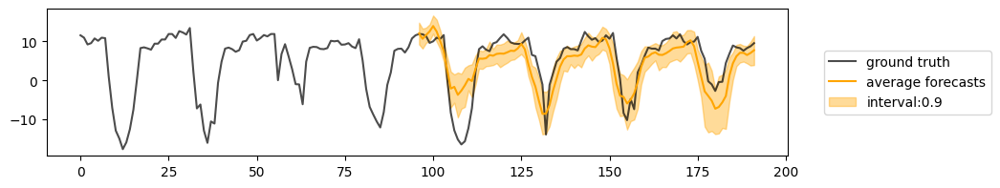

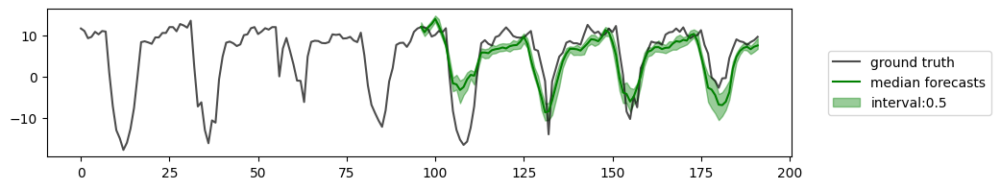

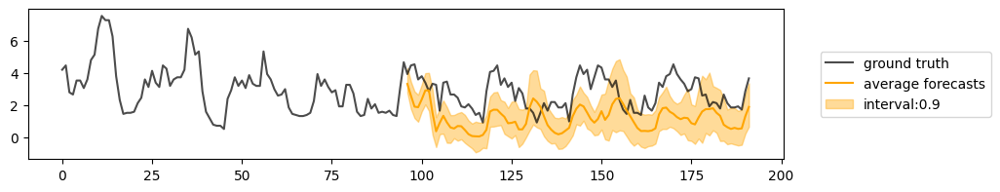

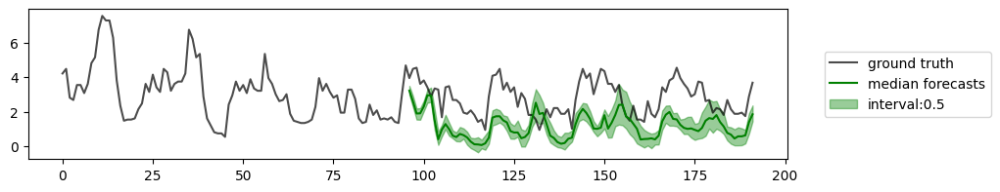

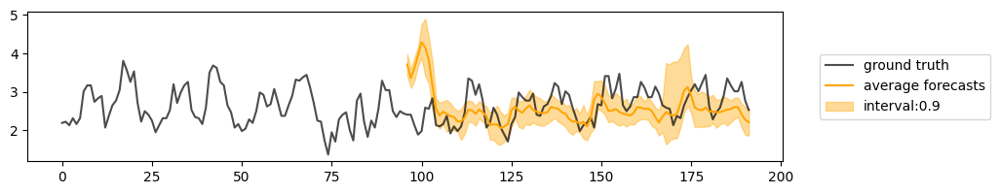

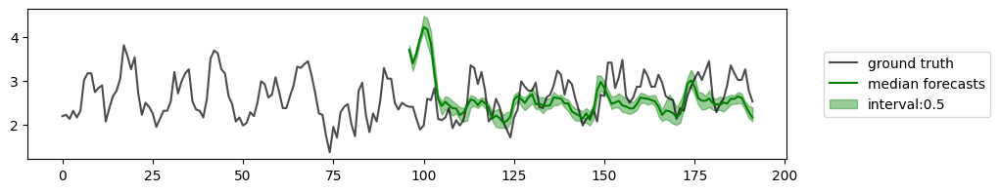

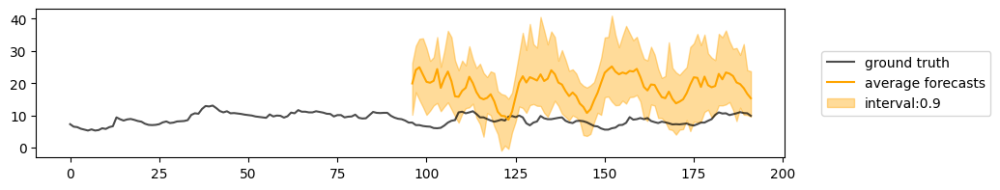

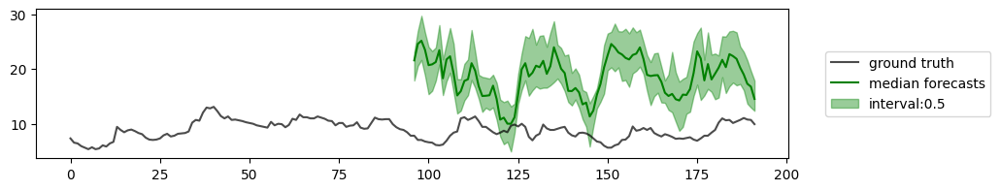

In [71]:
forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)

### Euler

In [73]:
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver = 'euler'
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [74]:
steps = [10, 15, 20, 30, 50, 100]
euler_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    euler_time.append(time_for_forecast(batch, model, n_repeats=1))
euler_time

100%|██████████| 6/6 [00:50<00:00,  8.35s/it]


[2.1469216346740723,
 3.2554142475128174,
 4.432835102081299,
 6.595141649246216,
 11.121994733810425,
 22.522897005081177]

In [75]:
euler_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[10, 15, 20, 30, 50, 100])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:04, 12.90s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4991944134235382
    96_test_CRPS-Sum        0.32177355885505676
      96_test_MASE           4.824242115020752
       96_test_MSE           1796.68017578125
     96_test_MSE-Sum          13584.822265625
       96_test_ND           0.6311500668525696
     96_test_ND-Sum         0.4074227511882782
      96_test_NRMSE          8.973278045654297
    96_test_NRMSE-Sum        4.075857639312744
   96_test_weighted_ND      0.6311500668525696
 96_test_weighted_ND-Sum    0.4074227511882782
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:29<01:00, 15.22s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4972895383834839
    96_test_CRPS-Sum        0.32829925417900085
      96_test_MASE          4.7063798904418945
       96_test_MSE           37.25486755371094
     96_test_MSE-Sum         320.1590270996094
       96_test_ND            0.624611496925354
     96_test_ND-Sum         0.43754345178604126
      96_test_NRMSE         1.1603708267211914
    96_test_NRMSE-Sum        0.585745632648468
   96_test_weighted_ND       0.624611496925354
 96_test_weighted_ND-Sum    0.43754345178604126
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:50<00:53, 17.78s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5026851296424866
    96_test_CRPS-Sum        0.33724164962768555
      96_test_MASE           4.622900009155273
       96_test_MSE          25.336727142333984
     96_test_MSE-Sum         260.7856140136719
       96_test_ND           0.6202893853187561
     96_test_ND-Sum         0.43981730937957764
      96_test_NRMSE         1.0026975870132446
    96_test_NRMSE-Sum       0.5416688919067383
   96_test_weighted_ND      0.6202893853187561
 96_test_weighted_ND-Sum    0.43981730937957764
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:19<00:44, 22.27s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5076718926429749
    96_test_CRPS-Sum        0.3367142379283905
      96_test_MASE           4.571077346801758
       96_test_MSE          25.089656829833984
     96_test_MSE-Sum         256.6904602050781
       96_test_ND           0.6148633360862732
     96_test_ND-Sum         0.43114563822746277
      96_test_NRMSE         0.9975295662879944
    96_test_NRMSE-Sum       0.5372584462165833
   96_test_weighted_ND      0.6148633360862732
 96_test_weighted_ND-Sum    0.43114563822746277
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:04<00:30, 30.40s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5111169815063477
    96_test_CRPS-Sum        0.3395983576774597
      96_test_MASE           4.494893550872803
       96_test_MSE          24.488422393798828
     96_test_MSE-Sum        255.91539001464844
       96_test_ND           0.6101682186126709
     96_test_ND-Sum         0.42926454544067383
      96_test_NRMSE         0.9889922142028809
    96_test_NRMSE-Sum       0.5376352667808533
   96_test_weighted_ND      0.6101682186126709
 96_test_weighted_ND-Sum    0.42926454544067383
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:29<00:00, 34.98s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5090522766113281
    96_test_CRPS-Sum        0.33608314394950867
      96_test_MASE           4.48007345199585
       96_test_MSE          24.234525680541992
     96_test_MSE-Sum        252.05291748046875
       96_test_ND           0.6073598265647888
     96_test_ND-Sum         0.4244909882545471
      96_test_NRMSE         0.9839605689048767
    96_test_NRMSE-Sum       0.5333232879638672
   96_test_weighted_ND      0.6073598265647888
 96_test_weighted_ND-Sum    0.4244909882545471
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [76]:
import pickle
with open("euler_metrics.pkl", "wb") as fp:
   pickle.dump(euler_metrics, fp)

10


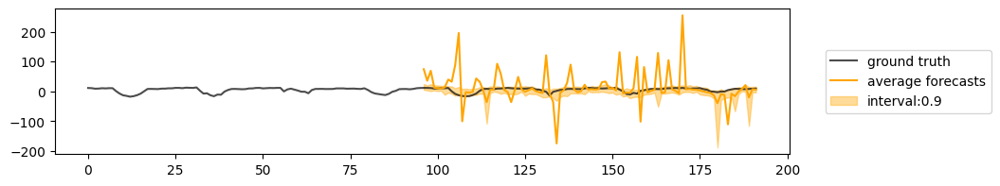

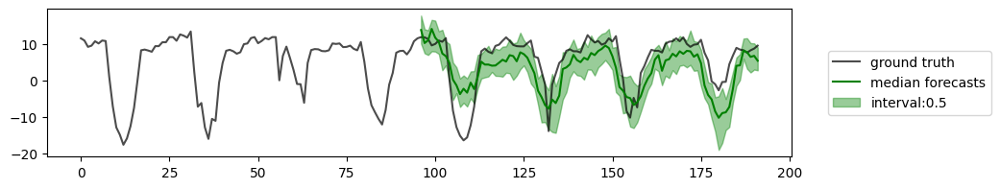

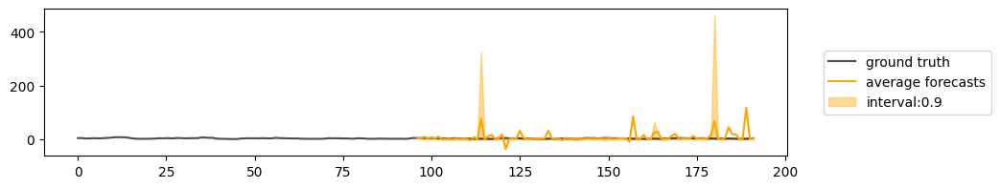

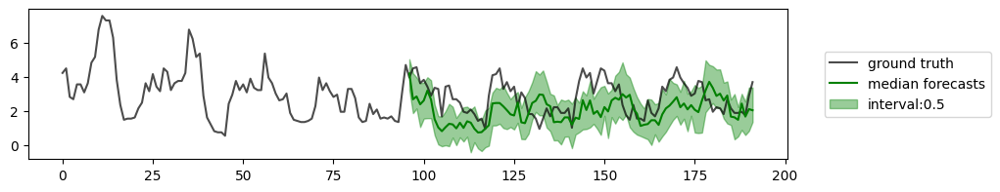

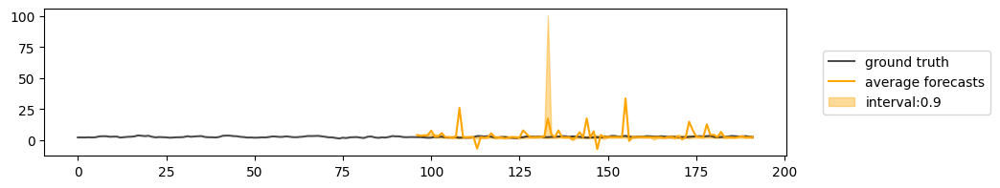

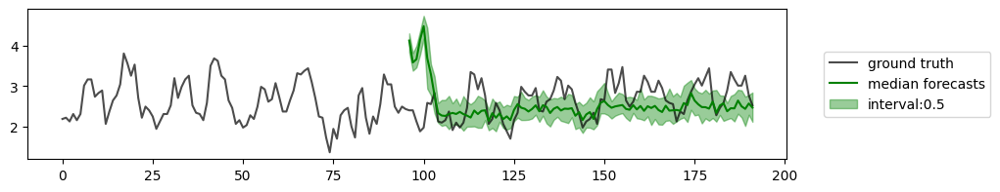

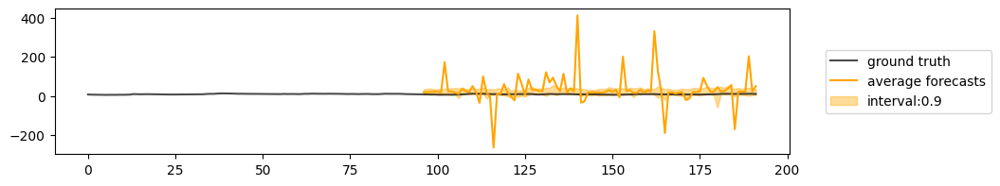

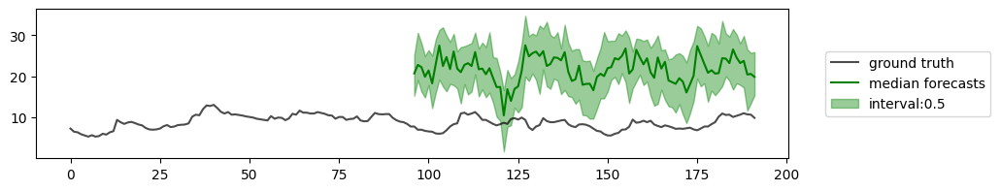

15


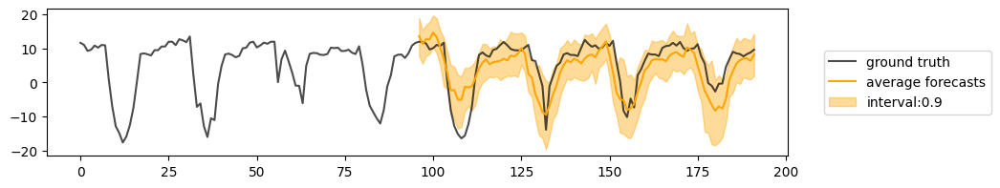

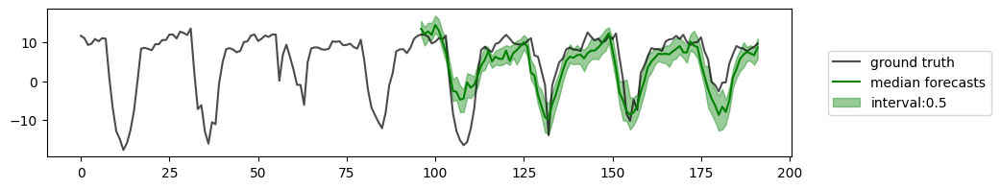

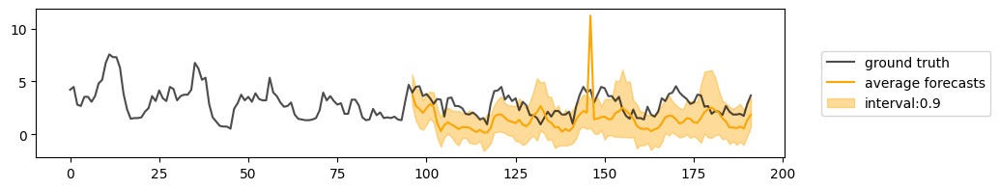

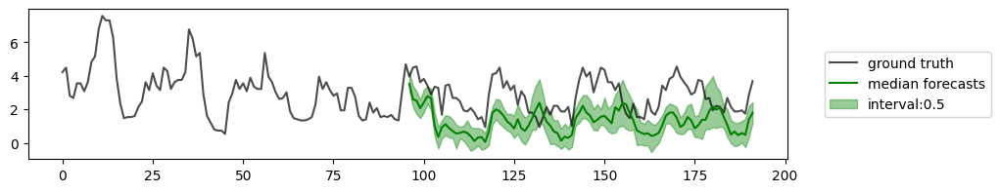

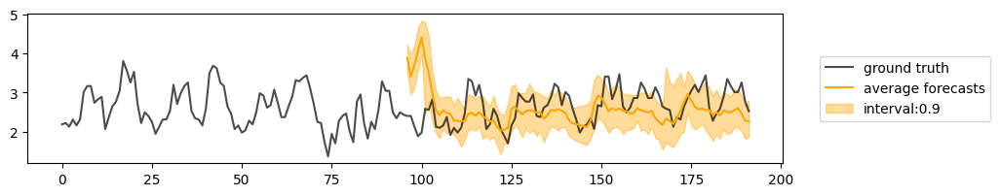

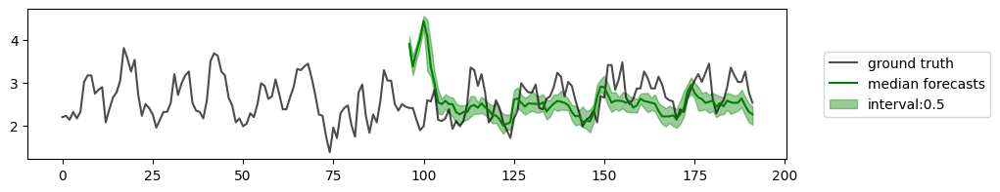

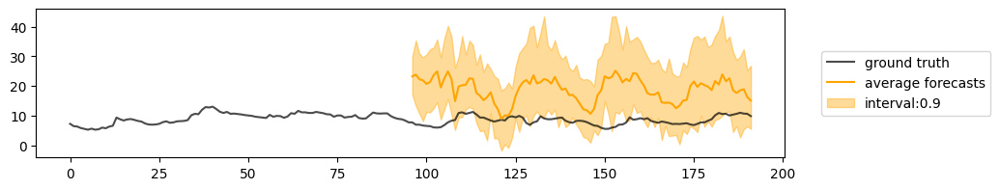

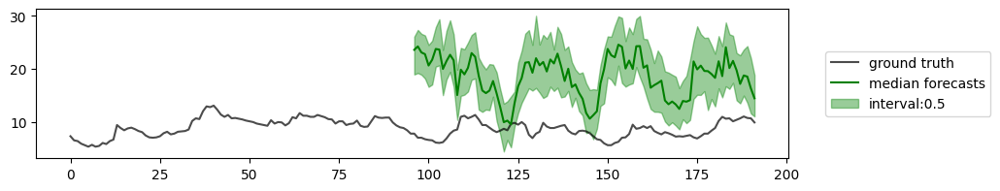

20


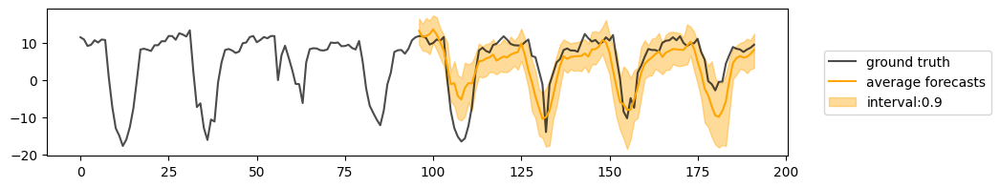

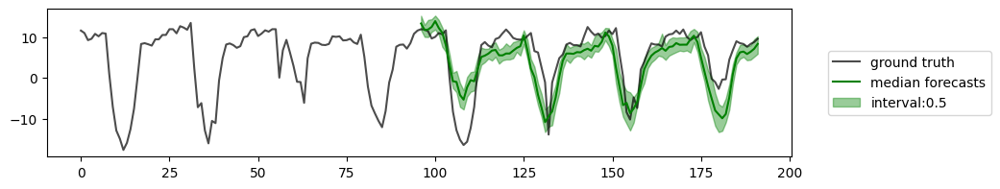

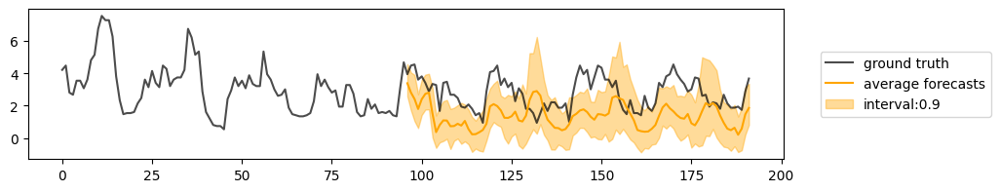

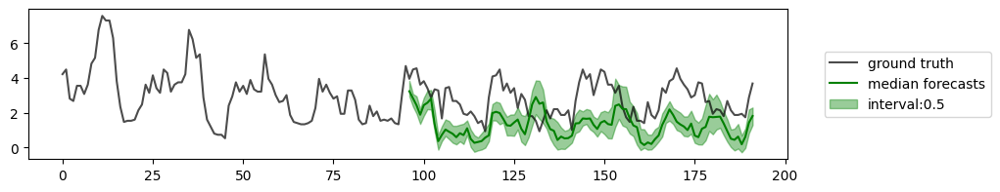

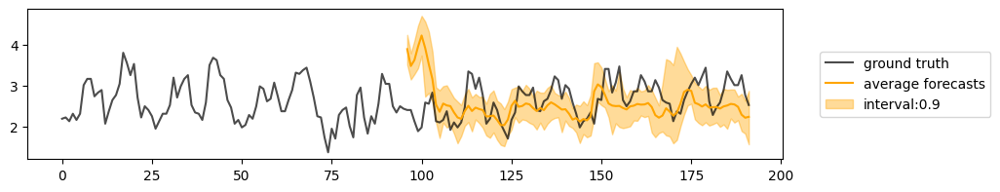

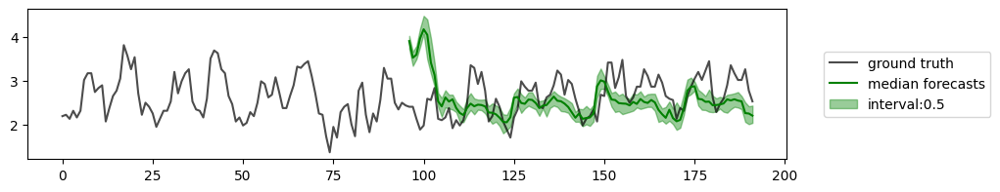

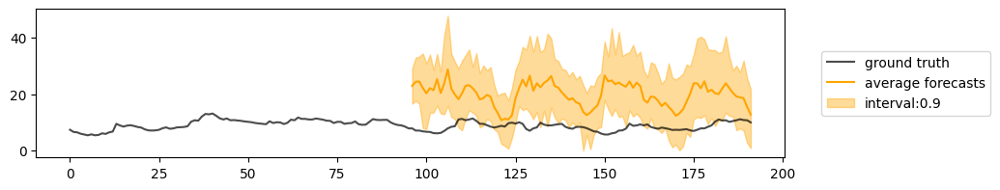

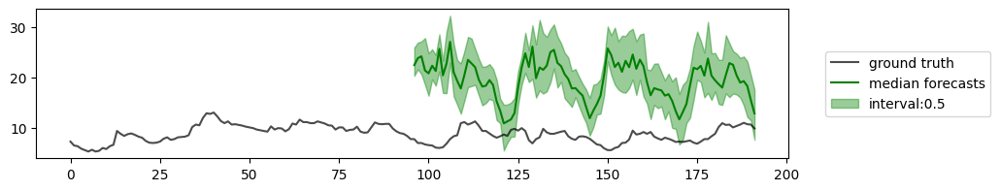

30


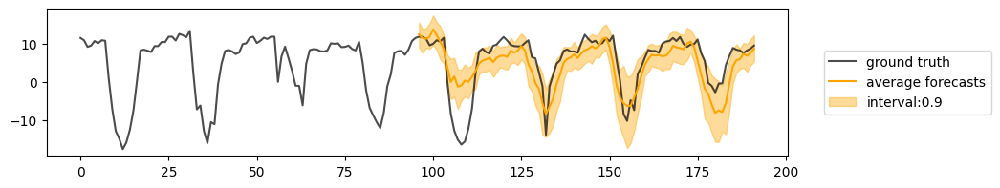

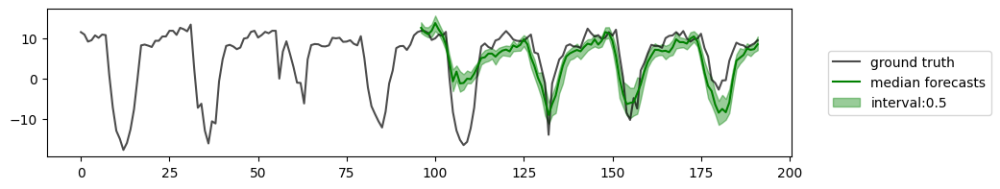

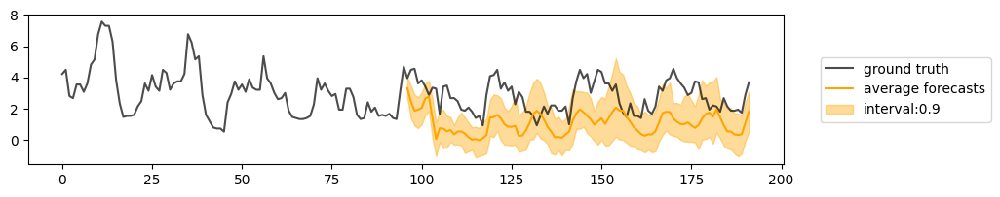

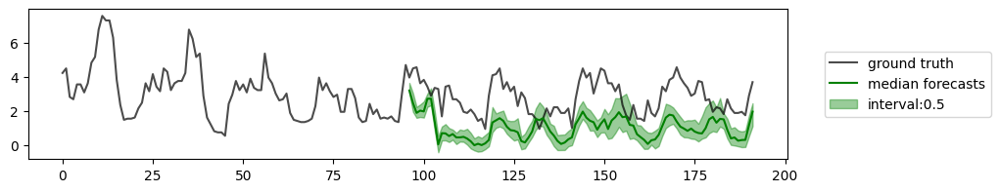

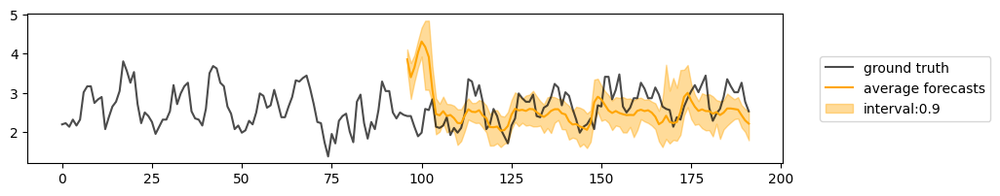

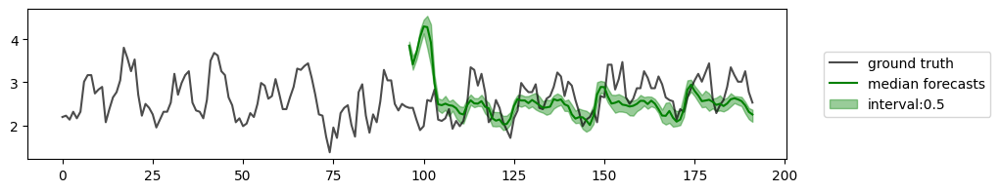

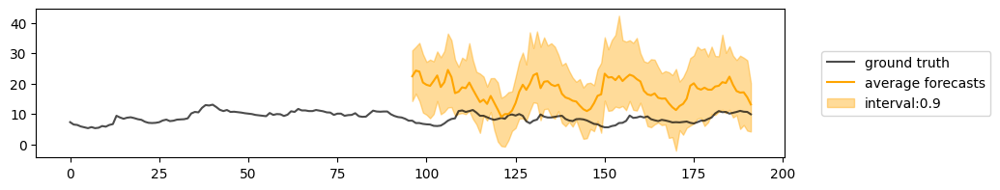

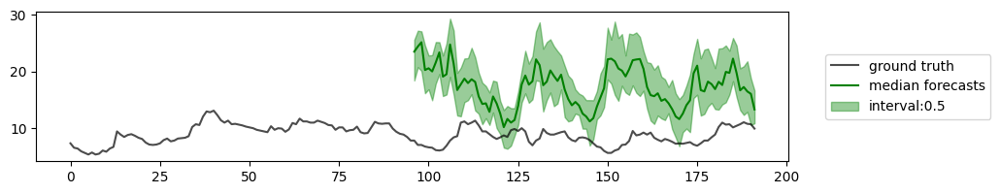

50


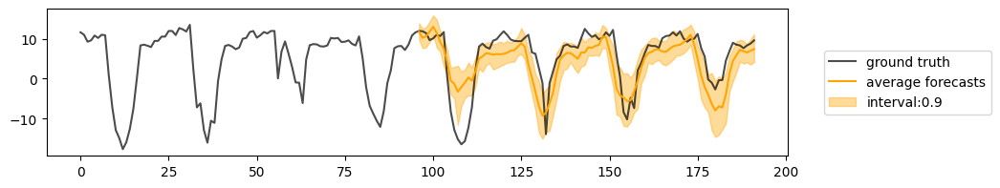

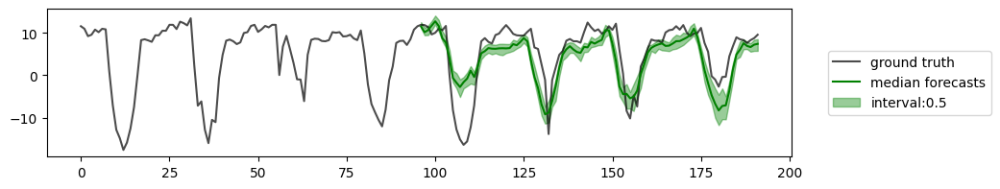

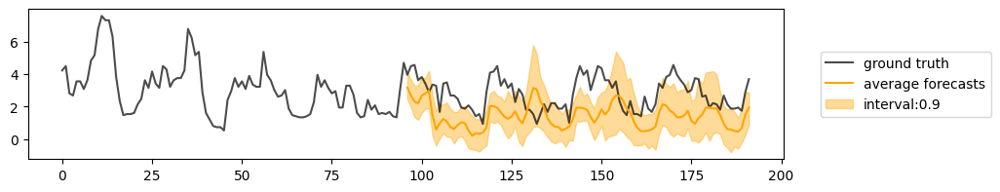

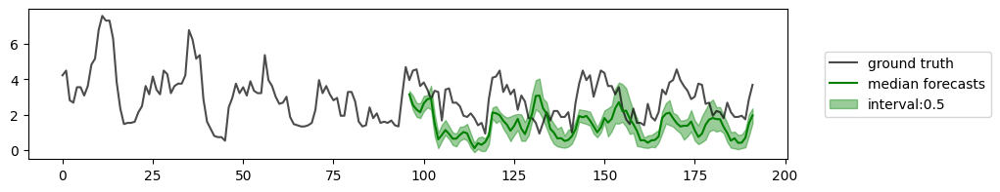

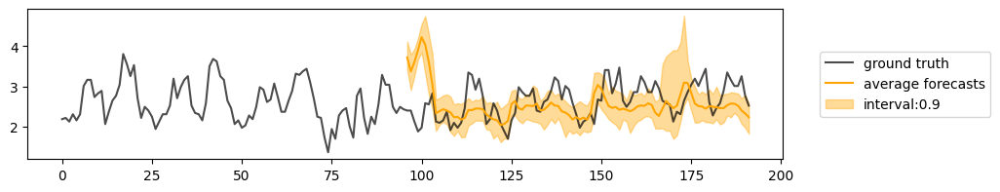

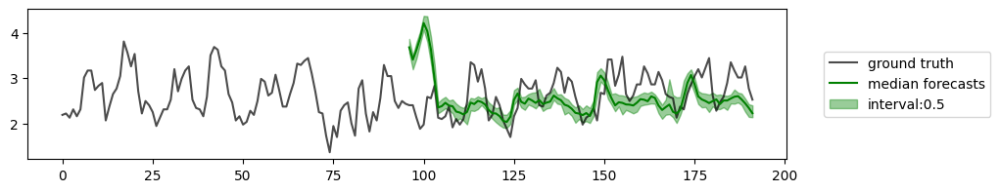

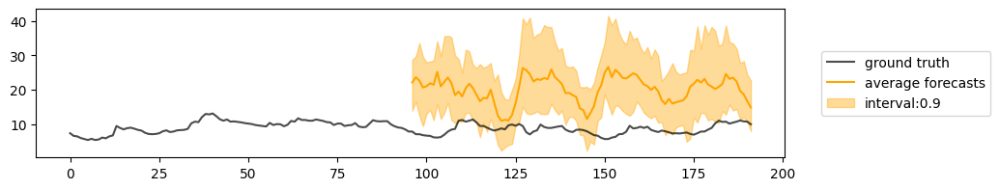

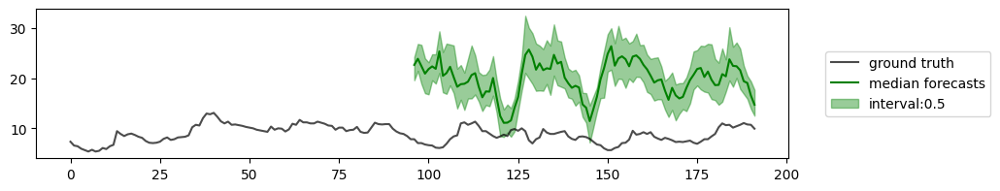

100


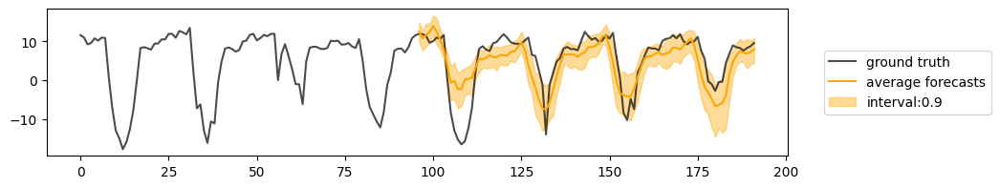

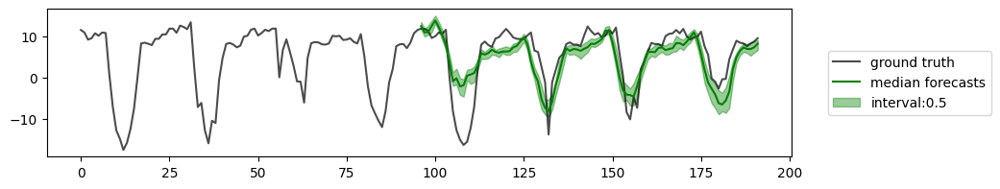

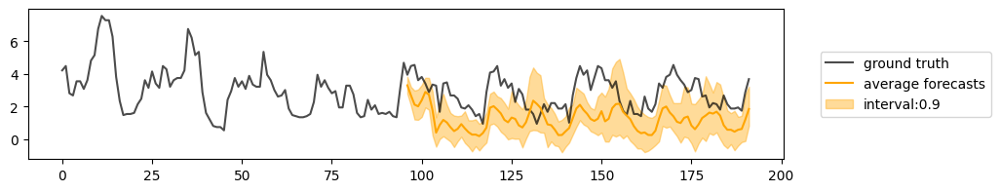

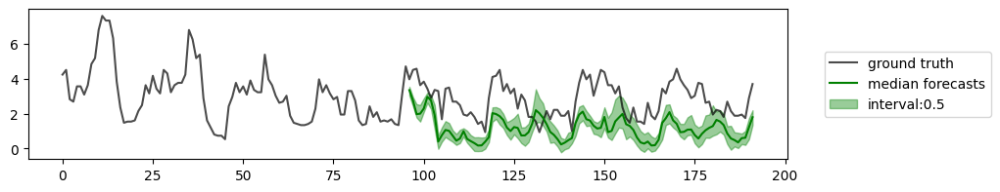

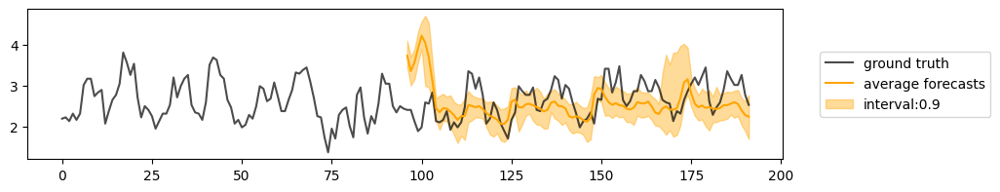

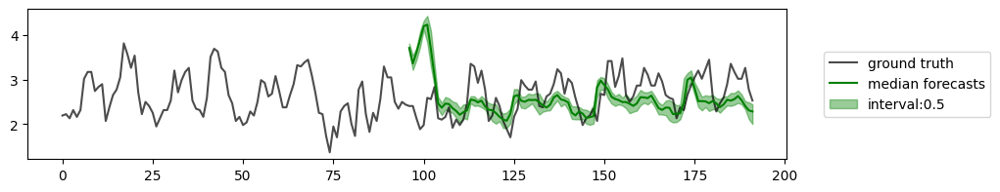

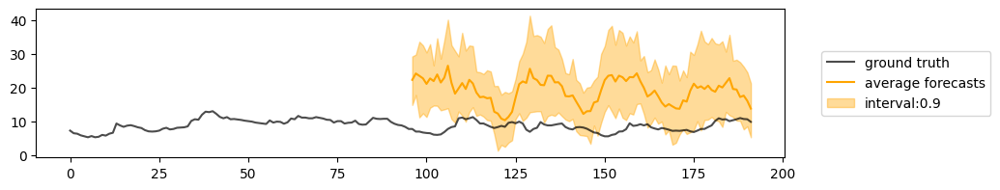

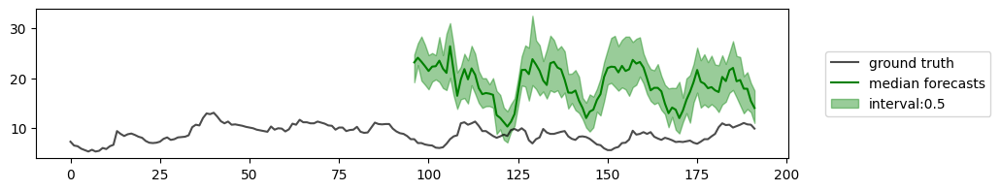

In [77]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### Heun

In [78]:
model.forecaster.prob_model.solver = 'heun'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [79]:
heun_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    heun_time.append(time_for_forecast(batch, model, n_repeats=1))
heun_time

100%|██████████| 6/6 [00:47<00:00,  7.95s/it]


[1.8846137523651123,
 2.7789742946624756,
 4.098511695861816,
 6.3232808113098145,
 10.744905471801758,
 21.864038944244385]

In [80]:
heun_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:00, 12.07s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           14.09103775024414
    96_test_CRPS-Sum        21.030473709106445
      96_test_MASE           9.865253448486328
       96_test_MSE             173659.296875
     96_test_MSE-Sum             1569671.5
       96_test_ND           1.4019497632980347
     96_test_ND-Sum          2.038321018218994
      96_test_NRMSE          89.2197494506836
    96_test_NRMSE-Sum        44.05521774291992
   96_test_weighted_ND      1.4019497632980347
 96_test_weighted_ND-Sum     2.038321018218994
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:27<00:55, 13.93s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.9259065985679626
    96_test_CRPS-Sum         2.036527395248413
      96_test_MASE           4.431490421295166
       96_test_MSE             216171.21875
     96_test_MSE-Sum            1772615.75
       96_test_ND           0.5984597206115723
     96_test_ND-Sum         0.39739763736724854
      96_test_NRMSE          98.10589599609375
    96_test_NRMSE-Sum       46.253482818603516
   96_test_weighted_ND      0.5984597206115723
 96_test_weighted_ND-Sum    0.39739763736724854
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:47<00:50, 16.80s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4930691123008728
    96_test_CRPS-Sum        0.3234255909919739
      96_test_MASE           4.528806686401367
       96_test_MSE              30673.6875
     96_test_MSE-Sum           211732.65625
       96_test_ND           0.6094870567321777
     96_test_ND-Sum         0.4222547113895416
      96_test_NRMSE          35.52899169921875
    96_test_NRMSE-Sum       15.391432762145996
   96_test_weighted_ND      0.6094870567321777
 96_test_weighted_ND-Sum    0.4222547113895416
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:15<00:42, 21.35s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5024192929267883
    96_test_CRPS-Sum        0.33274146914482117
      96_test_MASE           4.489137649536133
       96_test_MSE           597.275634765625
     96_test_MSE-Sum           4227.81640625
       96_test_ND           0.6075025796890259
     96_test_ND-Sum         0.42489564418792725
      96_test_NRMSE         2.0112624168395996
    96_test_NRMSE-Sum        0.977260947227478
   96_test_weighted_ND      0.6075025796890259
 96_test_weighted_ND-Sum    0.42489564418792725
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:00<00:29, 29.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5100312232971191
    96_test_CRPS-Sum        0.3396352529525757
      96_test_MASE           4.481777191162109
       96_test_MSE          24.356037139892578
     96_test_MSE-Sum        253.99436950683594
       96_test_ND           0.6077908277511597
     96_test_ND-Sum         0.4280465543270111
      96_test_NRMSE         0.9858735799789429
    96_test_NRMSE-Sum       0.5355881452560425
   96_test_weighted_ND      0.6077908277511597
 96_test_weighted_ND-Sum    0.4280465543270111
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:24<00:00, 34.15s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.509448230266571
    96_test_CRPS-Sum        0.3371414244174957
      96_test_MASE           4.440212726593018
       96_test_MSE           23.79568099975586
     96_test_MSE-Sum        249.88038635253906
       96_test_ND           0.6047782301902771
     96_test_ND-Sum         0.42372310161590576
      96_test_NRMSE         0.9783475995063782
    96_test_NRMSE-Sum       0.5331258773803711
   96_test_weighted_ND      0.6047782301902771
 96_test_weighted_ND-Sum    0.42372310161590576
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [81]:
import pickle
with open("heun_metrics.pkl", "wb") as fp:
   pickle.dump(heun_metrics, fp)

10


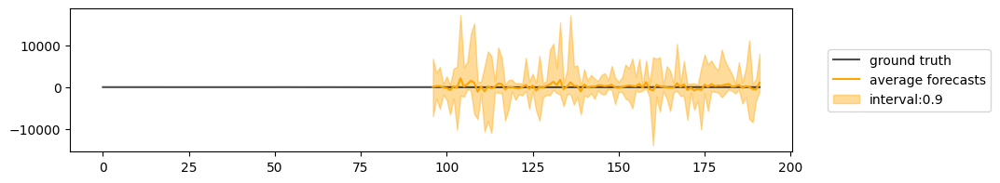

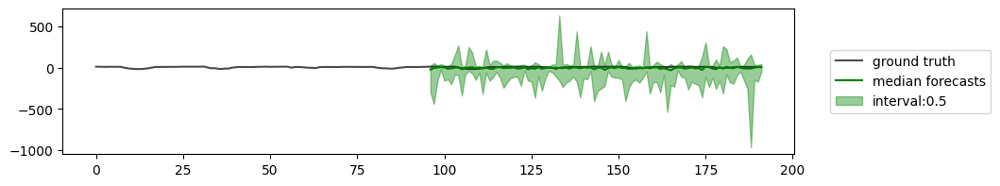

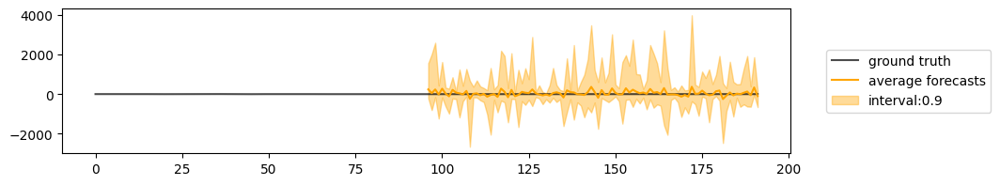

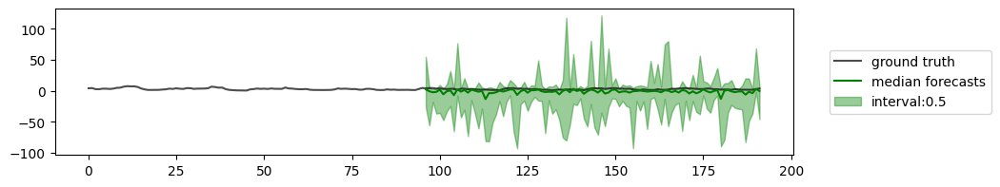

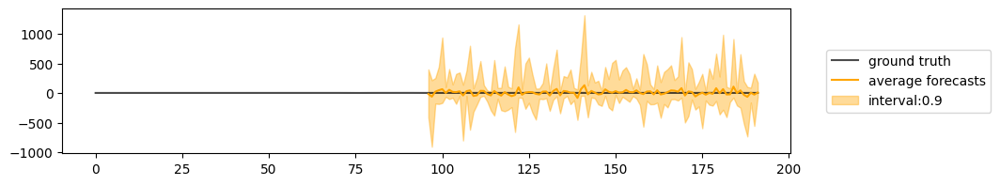

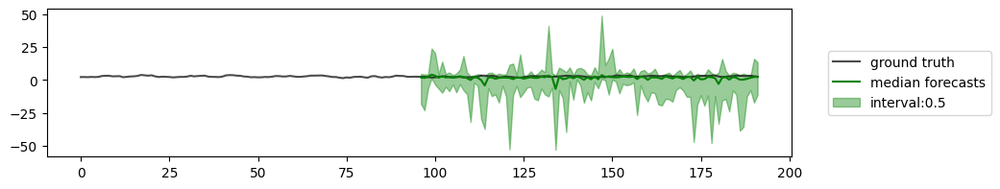

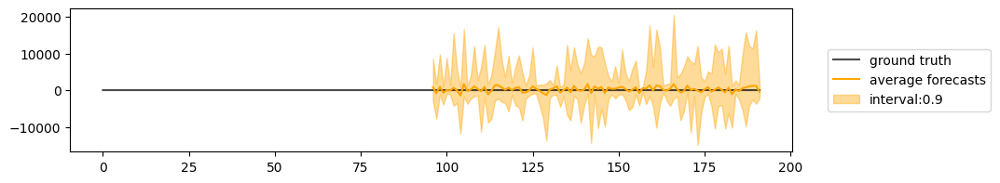

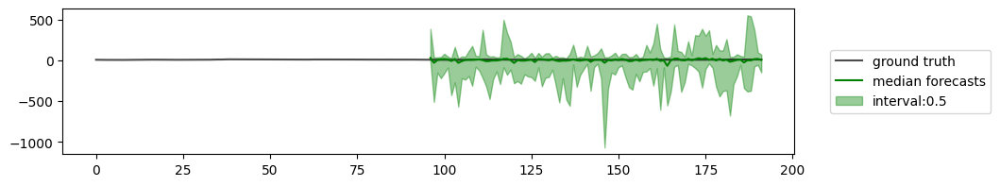

15


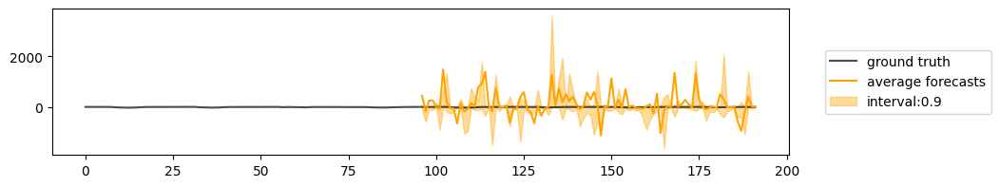

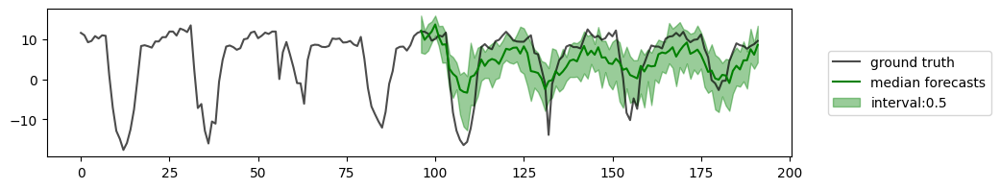

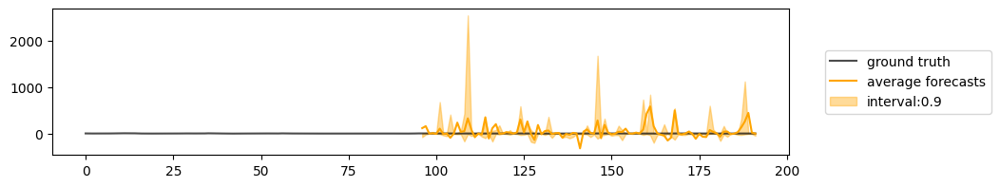

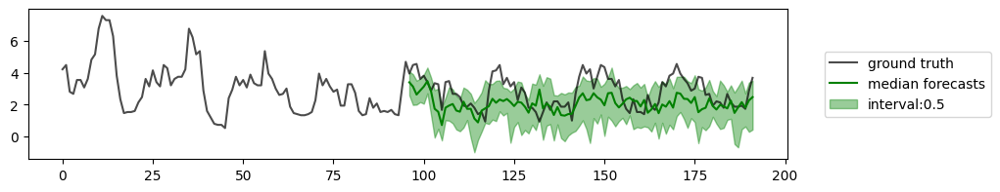

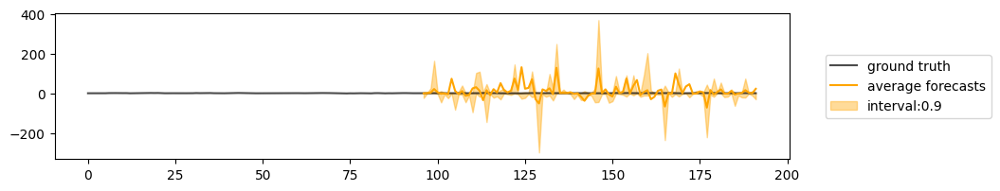

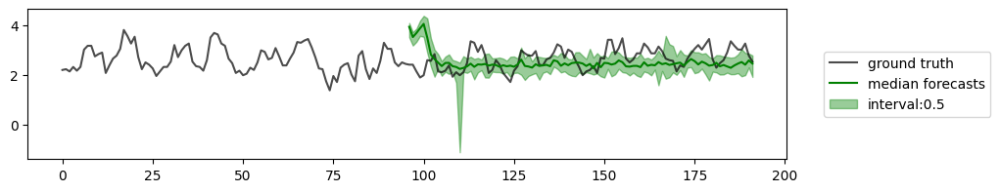

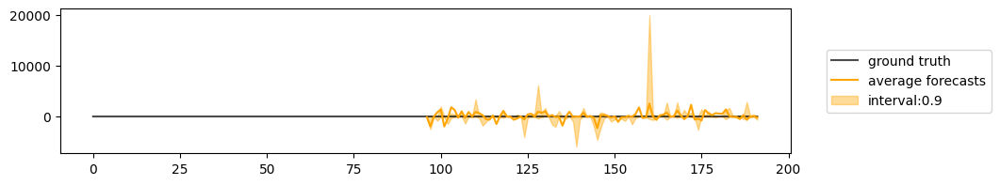

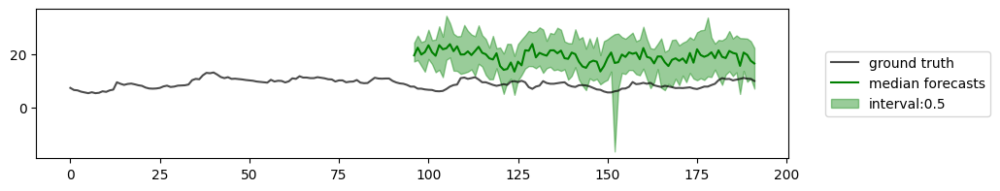

20


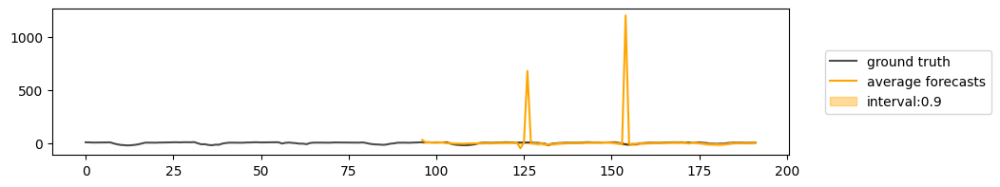

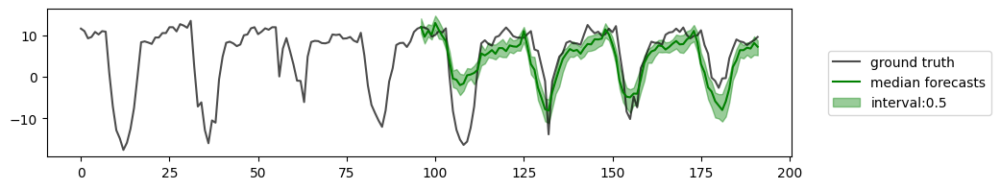

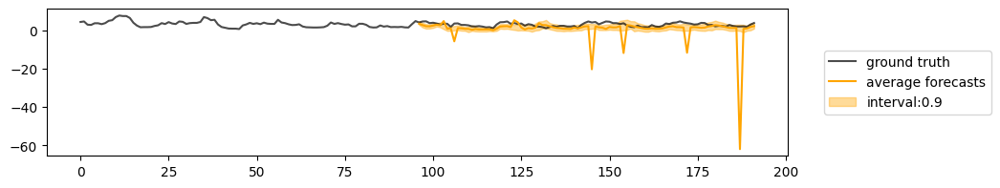

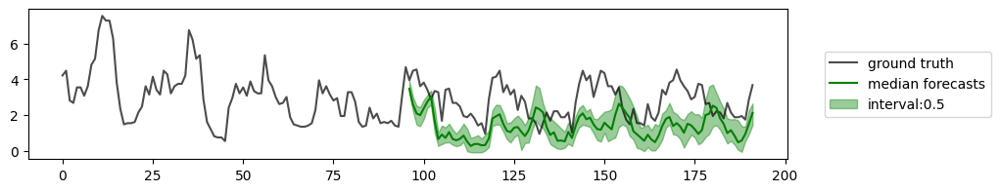

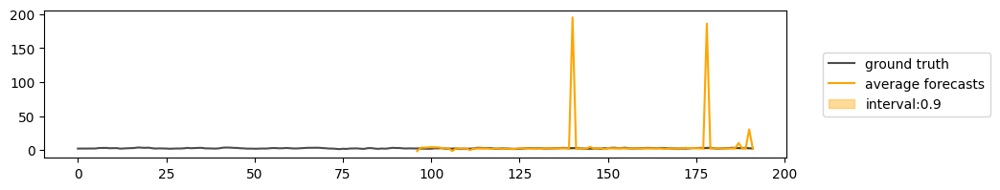

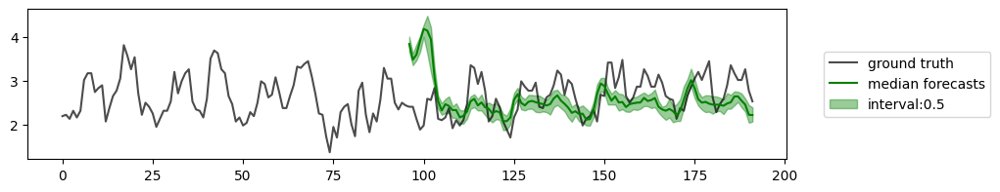

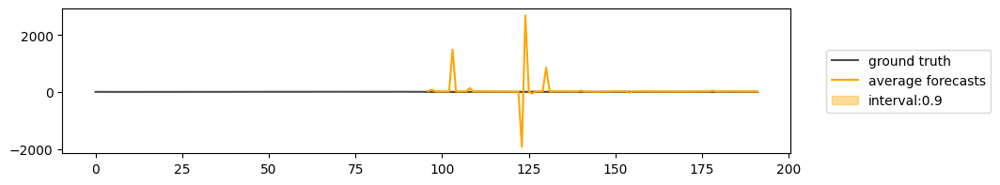

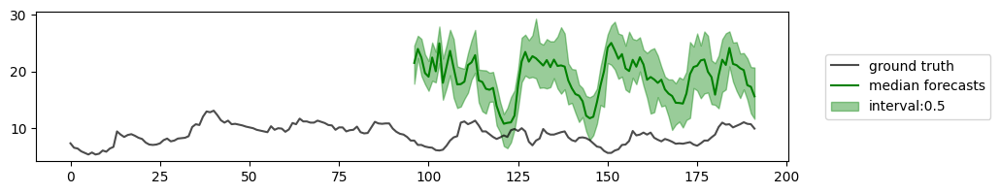

30


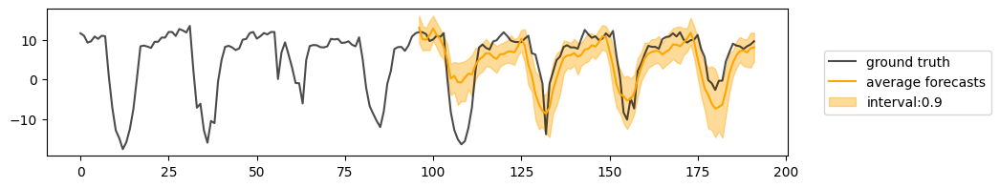

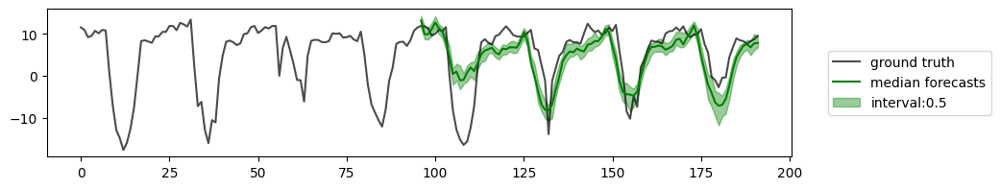

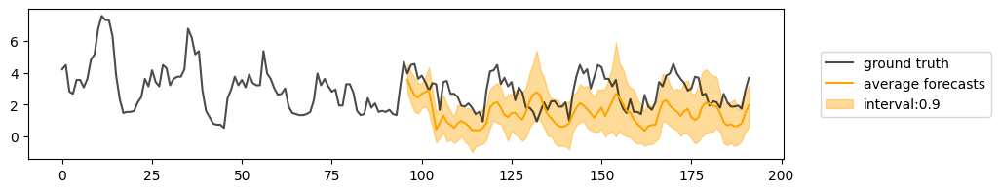

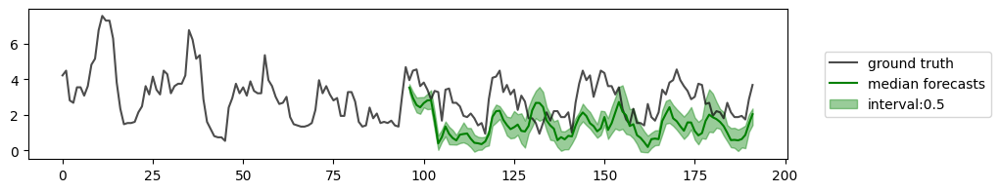

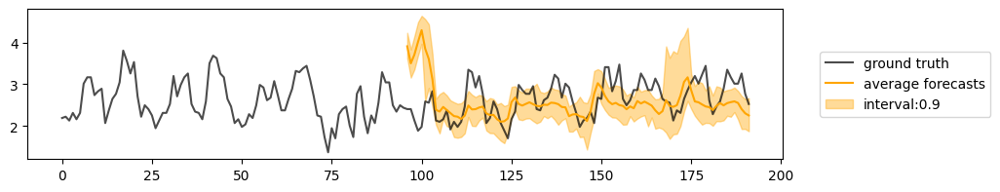

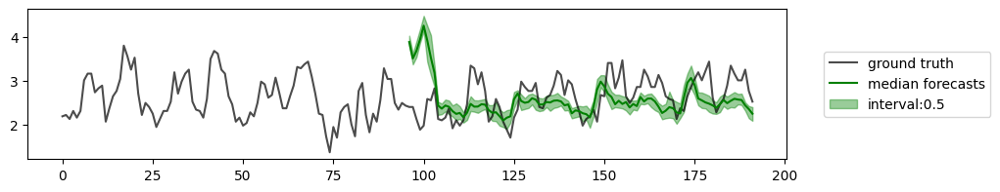

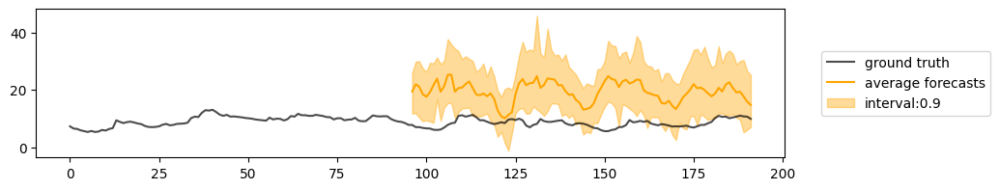

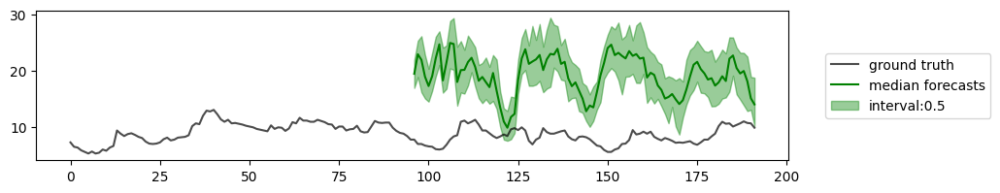

50


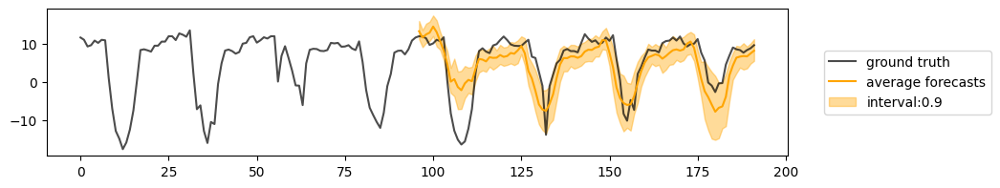

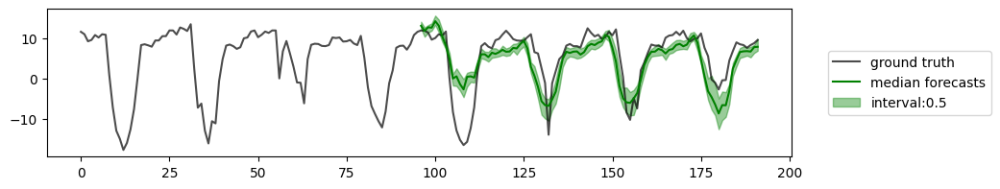

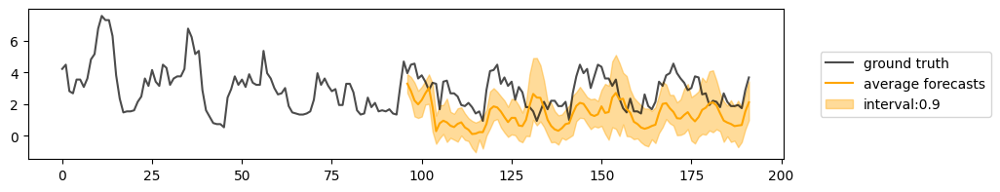

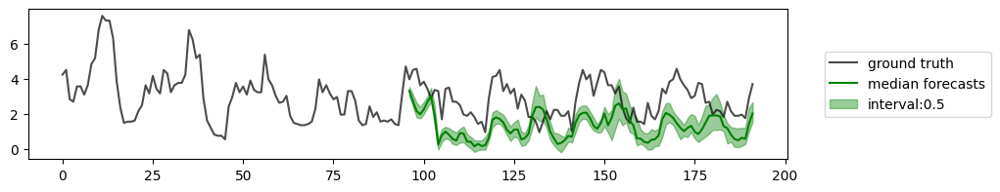

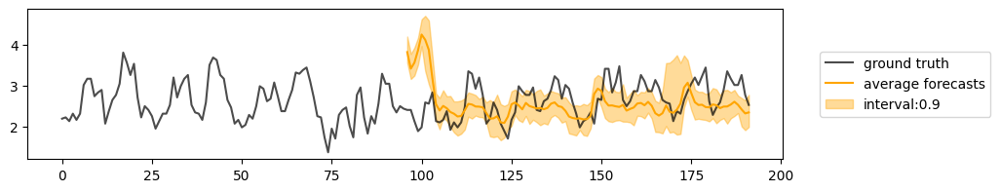

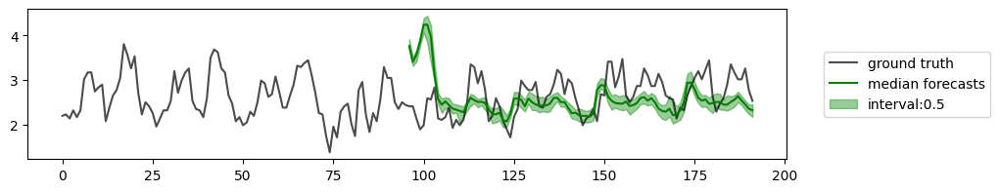

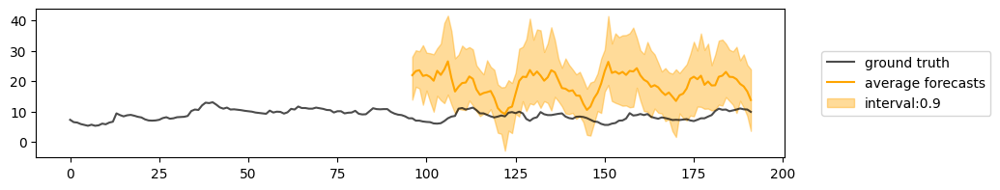

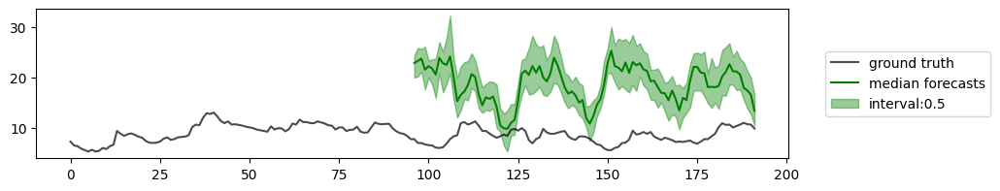

100


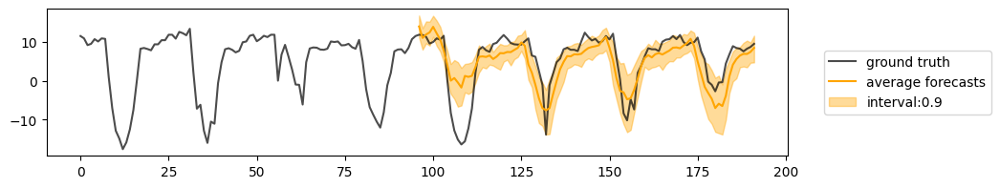

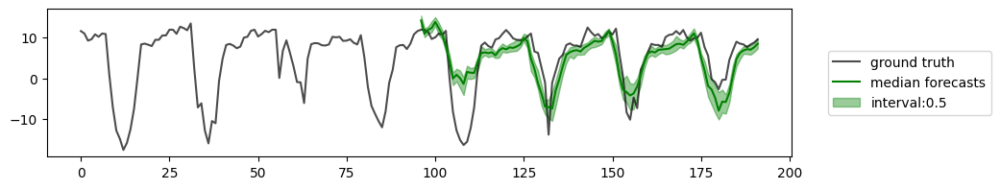

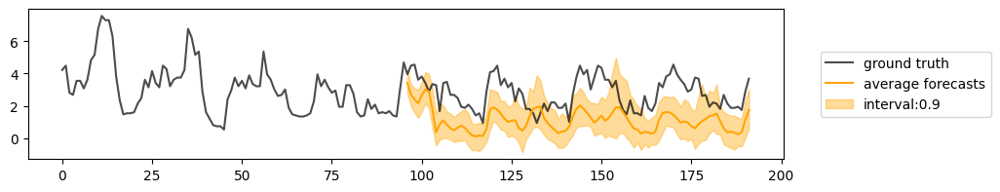

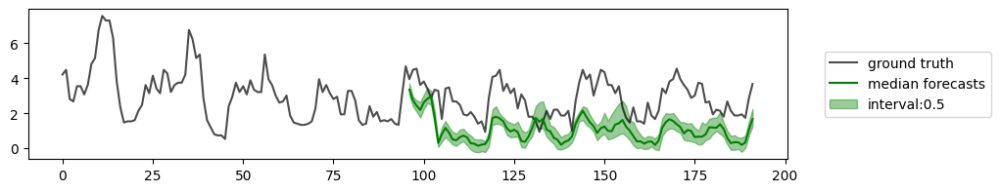

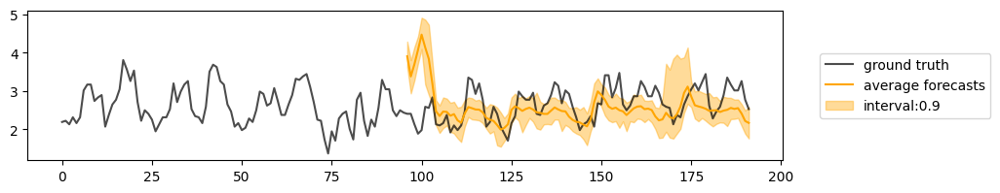

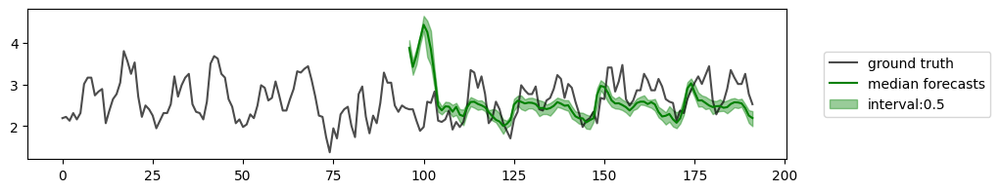

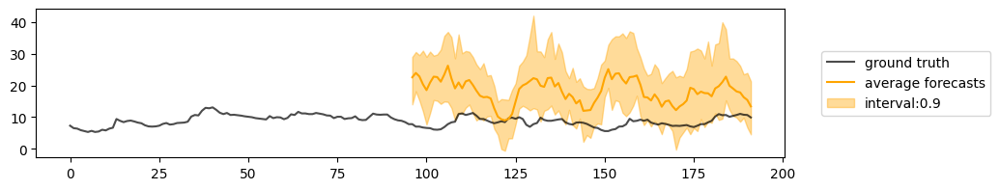

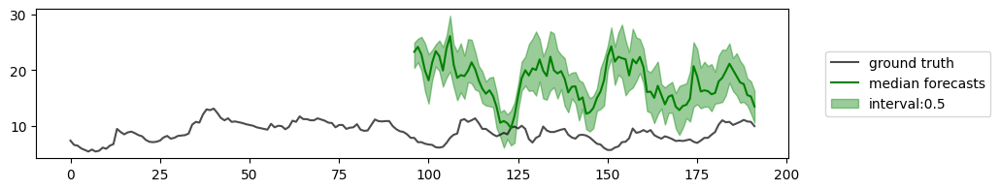

In [82]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, quad

In [83]:
model.forecaster.prob_model.solver = 'ddim'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'quad'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [84]:
ddim_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    ddim_time.append(time_for_forecast(batch, model, n_repeats=1))
ddim_time

100%|██████████| 6/6 [00:48<00:00,  8.02s/it]


[2.047062873840332,
 3.1548197269439697,
 4.227992534637451,
 6.402302026748657,
 10.763969898223877,
 21.529414653778076]

In [85]:
ddim_quad_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:03, 12.72s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5599586963653564
    96_test_CRPS-Sum        0.42269018292427063
      96_test_MASE          4.7217326164245605
       96_test_MSE           12849.3330078125
     96_test_MSE-Sum             93678.375
       96_test_ND           0.6464000940322876
     96_test_ND-Sum         0.4491482675075531
      96_test_NRMSE         23.442127227783203
    96_test_NRMSE-Sum       10.430194854736328
   96_test_weighted_ND      0.6464000940322876
 96_test_weighted_ND-Sum    0.4491482675075531
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:29<01:00, 15.24s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5004019737243652
    96_test_CRPS-Sum        0.33149048686027527
      96_test_MASE           4.567595958709717
       96_test_MSE           6113.00146484375
     96_test_MSE-Sum          41325.18359375
       96_test_ND           0.6180385947227478
     96_test_ND-Sum         0.4332336485385895
      96_test_NRMSE         14.307306289672852
    96_test_NRMSE-Sum        6.039264678955078
   96_test_weighted_ND      0.6180385947227478
 96_test_weighted_ND-Sum    0.4332336485385895
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:50<00:52, 17.62s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5064699053764343
    96_test_CRPS-Sum        0.33613479137420654
      96_test_MASE           4.562637805938721
       96_test_MSE           2220.982177734375
     96_test_MSE-Sum         15944.4404296875
       96_test_ND           0.6175298690795898
     96_test_ND-Sum         0.4342913329601288
      96_test_NRMSE          8.946069717407227
    96_test_NRMSE-Sum        3.830812692642212
   96_test_weighted_ND      0.6175298690795898
 96_test_weighted_ND-Sum    0.4342913329601288
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:18<00:43, 21.87s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5091612339019775
    96_test_CRPS-Sum        0.3370825946331024
      96_test_MASE           4.528162479400635
       96_test_MSE          1158.9420166015625
     96_test_MSE-Sum          8017.486328125
       96_test_ND           0.6145191788673401
     96_test_ND-Sum         0.43163836002349854
      96_test_NRMSE          5.94457483291626
    96_test_NRMSE-Sum       2.5197227001190186
   96_test_weighted_ND      0.6145191788673401
 96_test_weighted_ND-Sum    0.43163836002349854
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:02<00:29, 29.89s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5093878507614136
    96_test_CRPS-Sum        0.33598393201828003
      96_test_MASE           4.517819881439209
       96_test_MSE           1048.19775390625
     96_test_MSE-Sum         7506.86181640625
       96_test_ND           0.6135363578796387
     96_test_ND-Sum         0.42880821228027344
      96_test_NRMSE          5.282164096832275
    96_test_NRMSE-Sum       2.3022446632385254
   96_test_weighted_ND      0.6135363578796387
 96_test_weighted_ND-Sum    0.42880821228027344
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:26<00:00, 34.38s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5102245211601257
    96_test_CRPS-Sum        0.3384135067462921
      96_test_MASE           4.521326541900635
       96_test_MSE           419.8030700683594
     96_test_MSE-Sum           2863.3828125
       96_test_ND           0.6135492920875549
     96_test_ND-Sum         0.43144020438194275
      96_test_NRMSE          3.371007204055786
    96_test_NRMSE-Sum       1.4406745433807373
   96_test_weighted_ND      0.6135492920875549
 96_test_weighted_ND-Sum    0.43144020438194275
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [86]:
with open("ddim_quad_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_quad_metrics, fp)

10


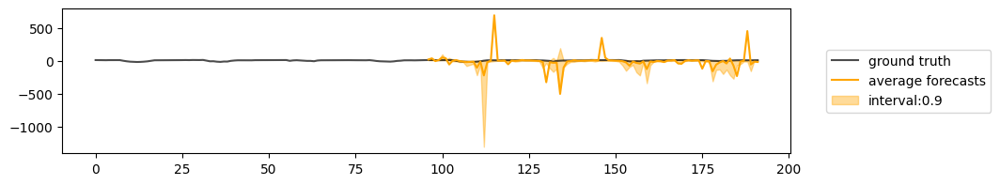

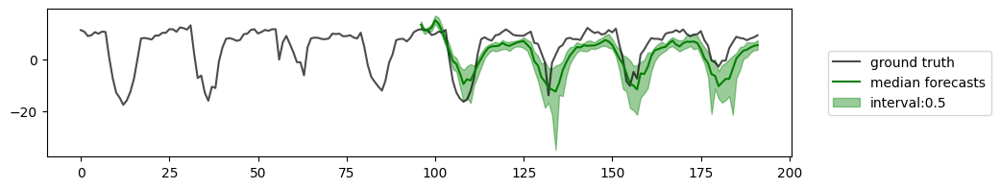

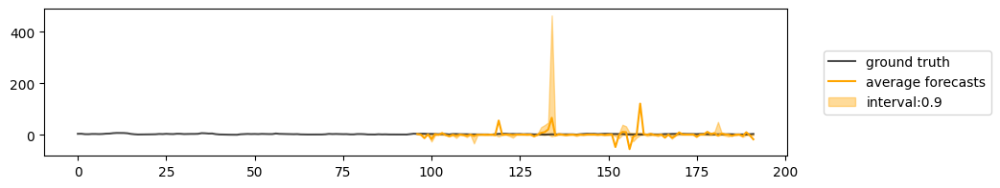

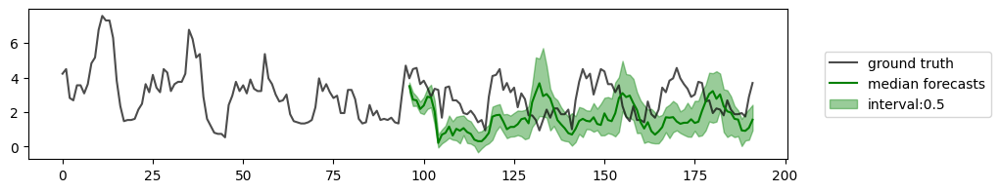

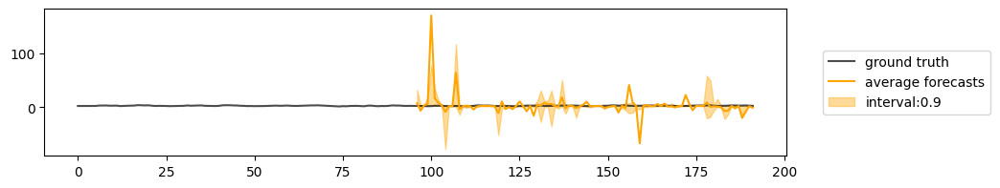

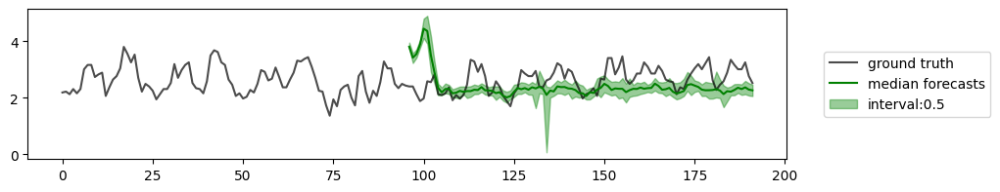

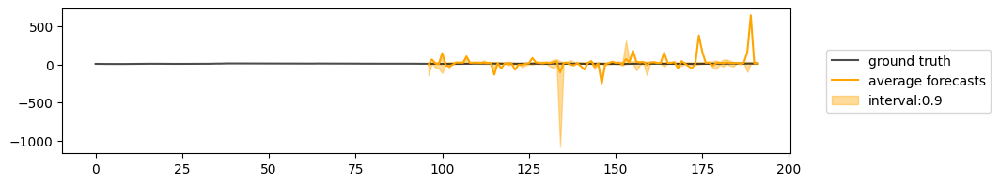

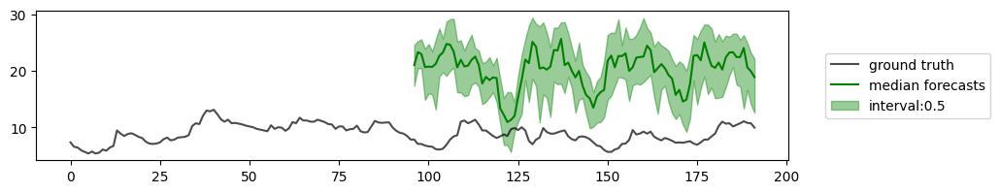

15


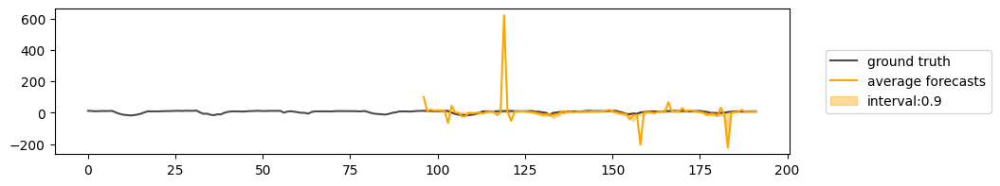

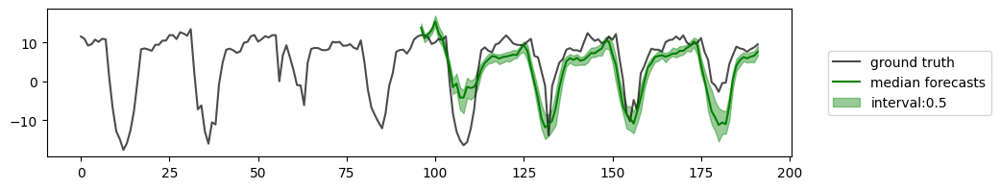

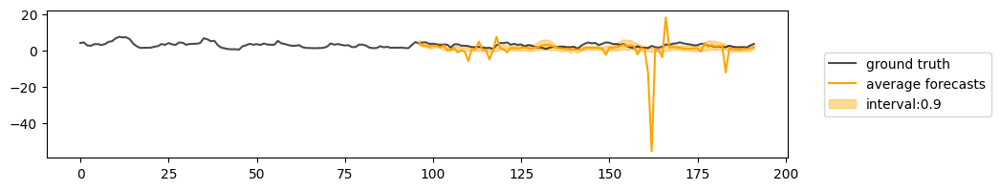

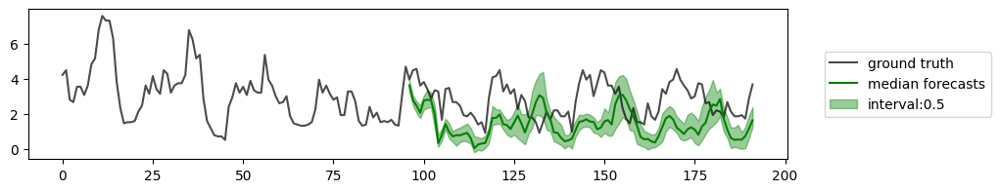

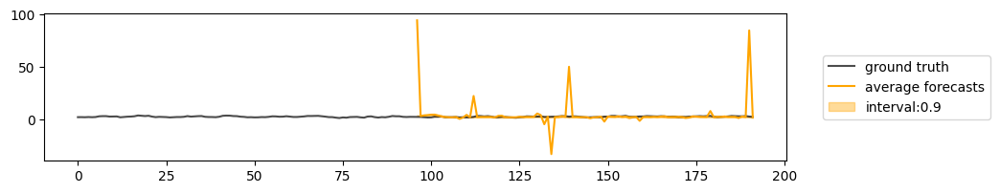

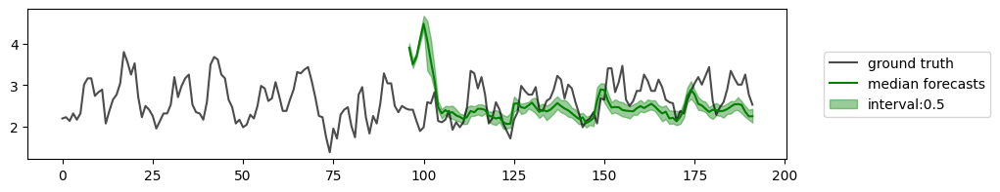

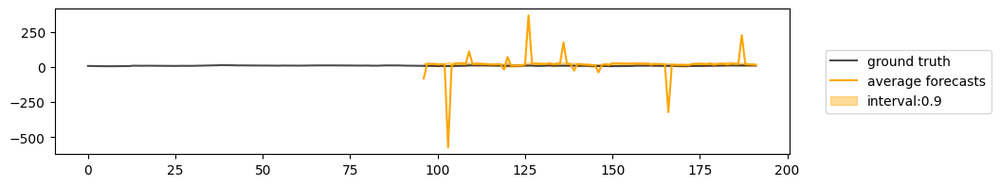

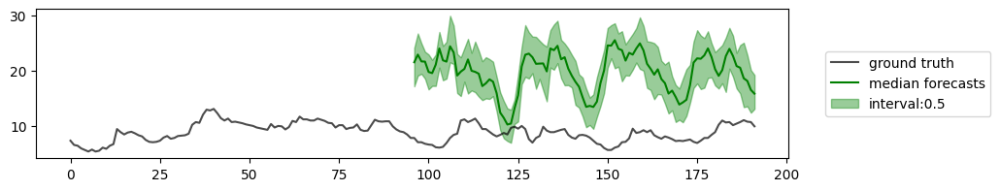

20


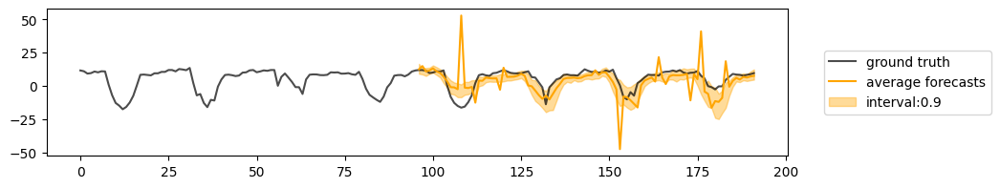

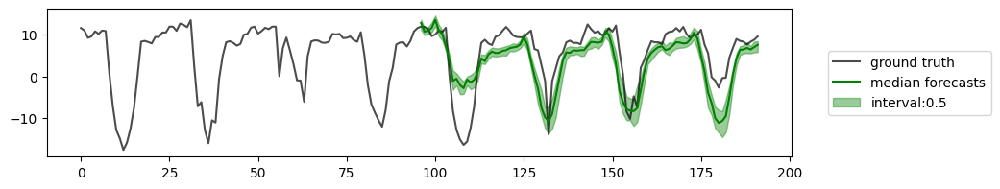

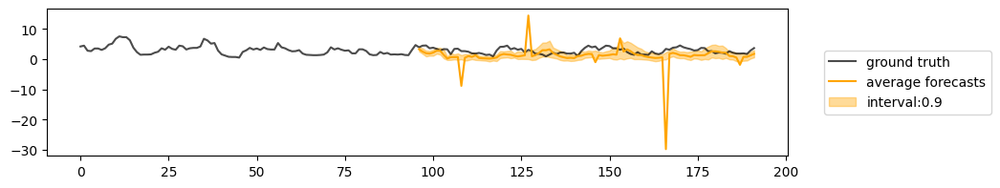

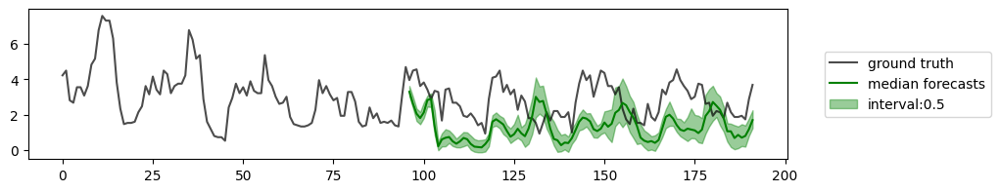

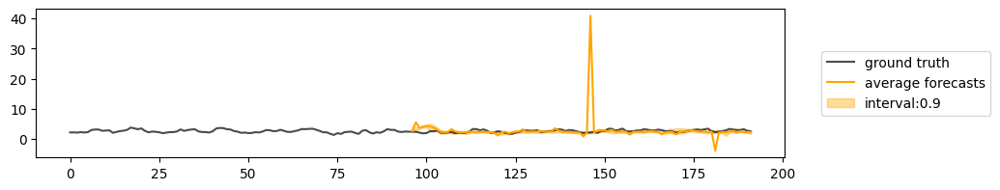

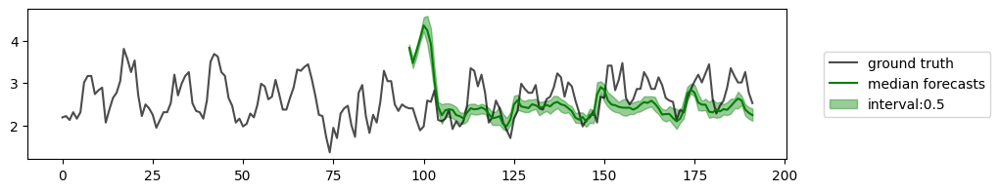

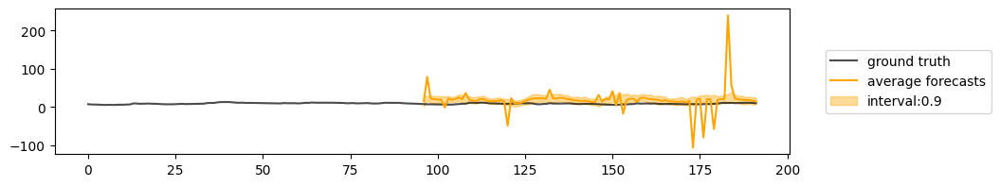

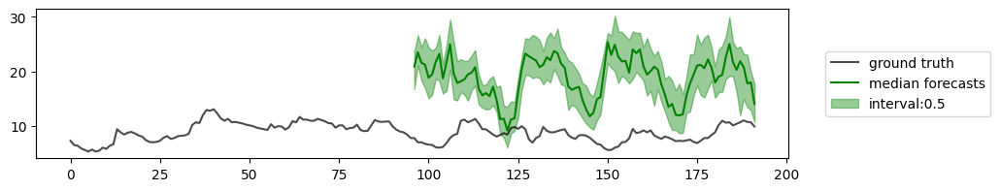

30


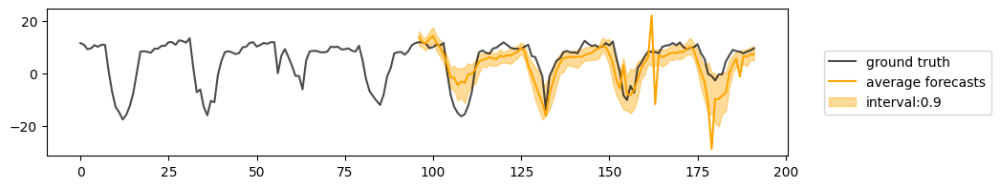

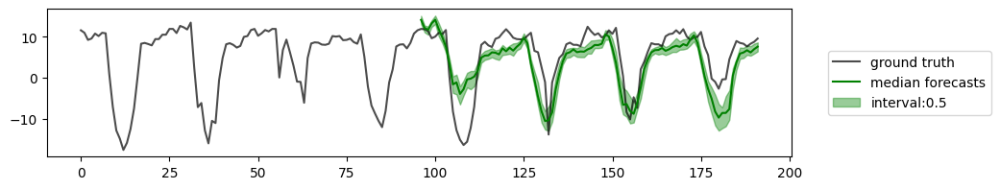

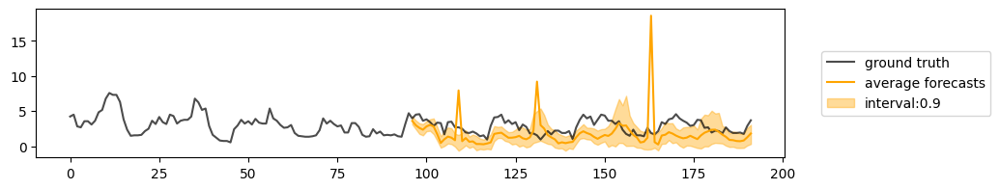

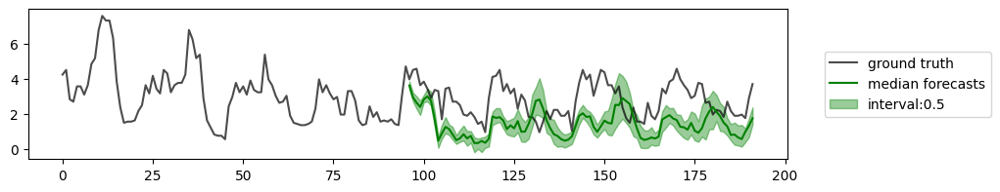

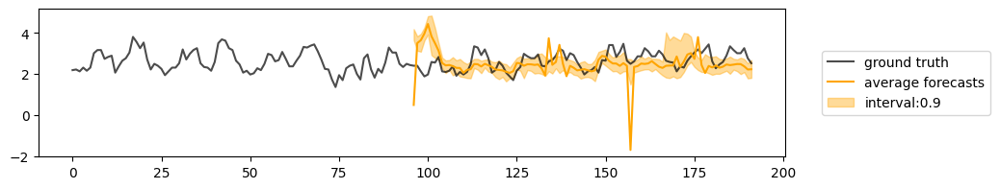

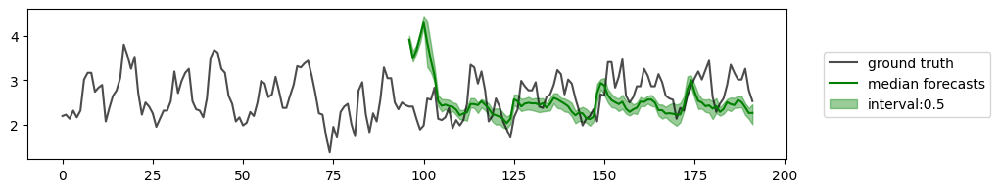

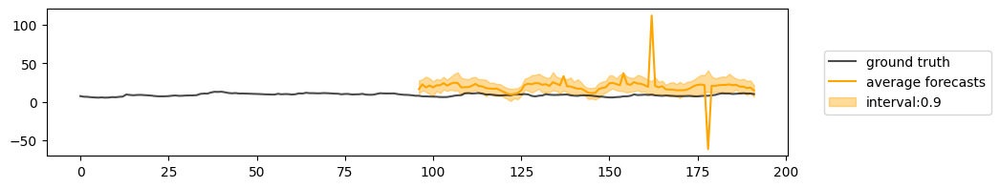

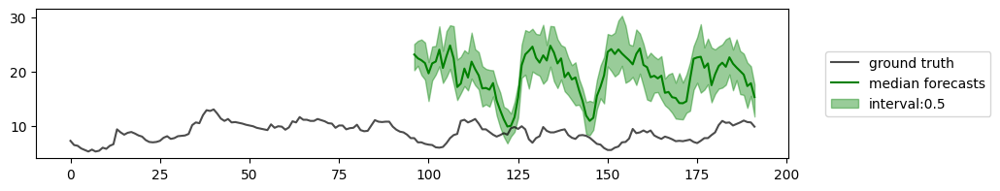

50


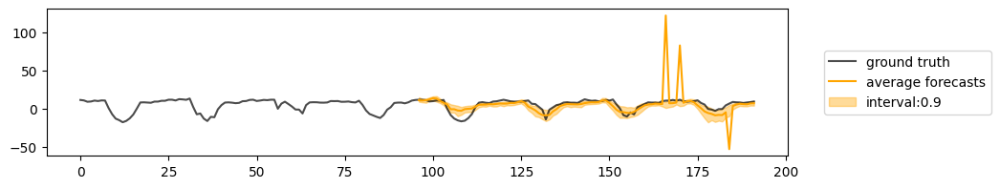

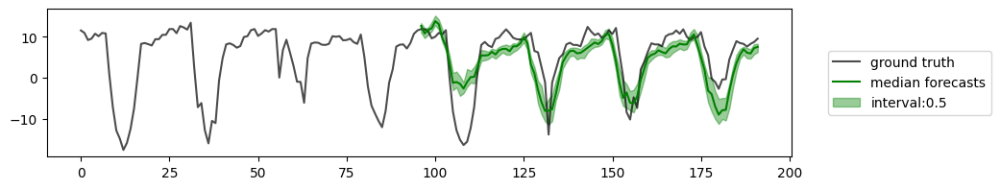

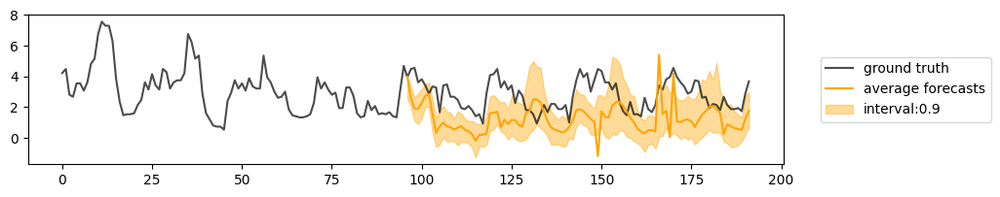

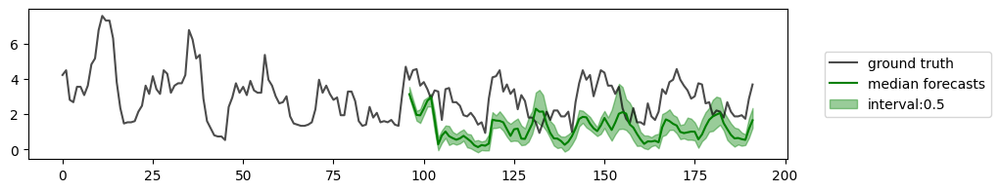

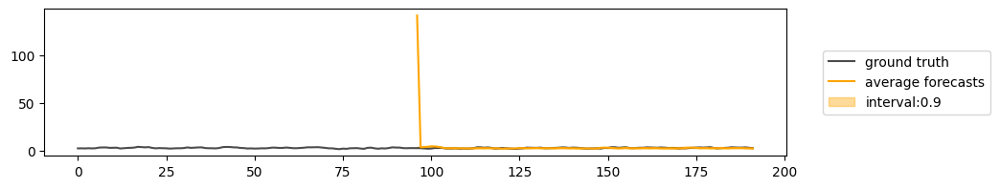

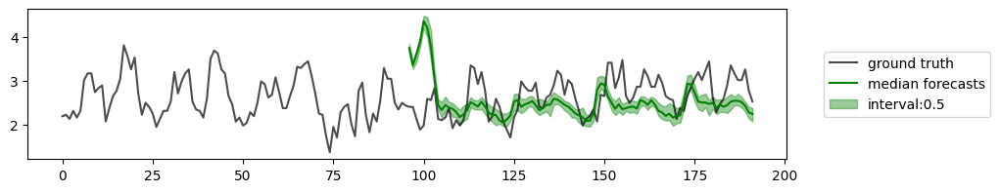

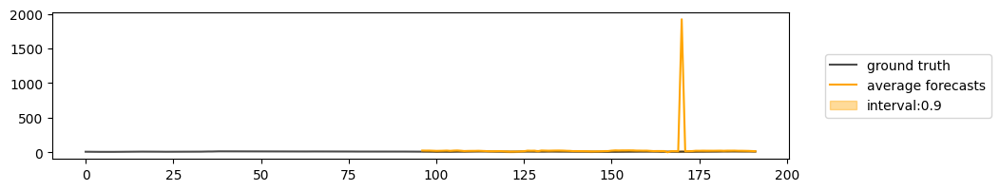

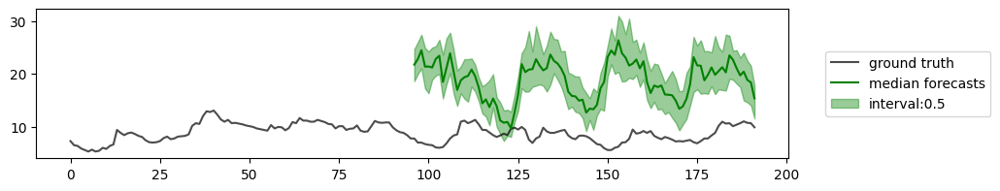

100


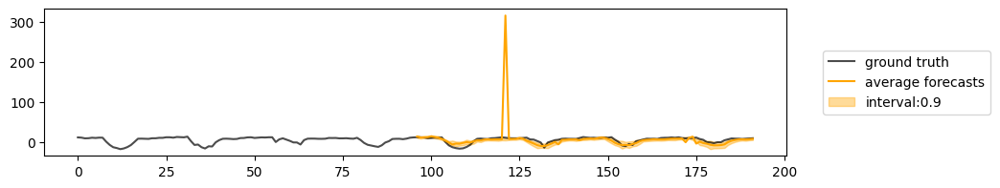

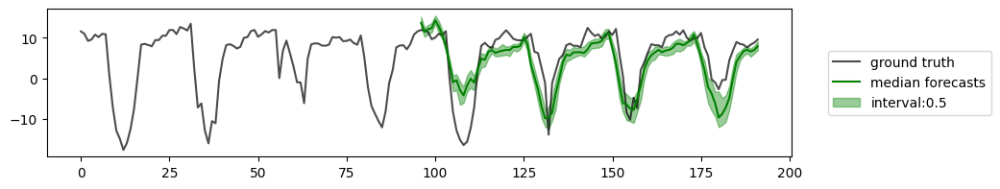

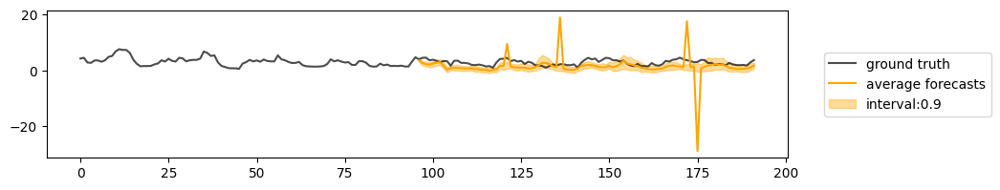

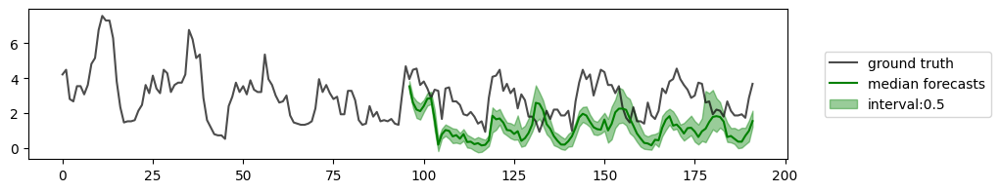

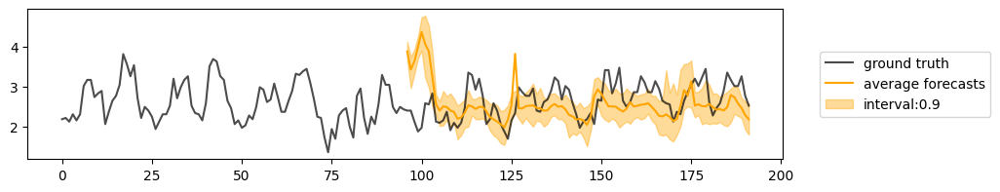

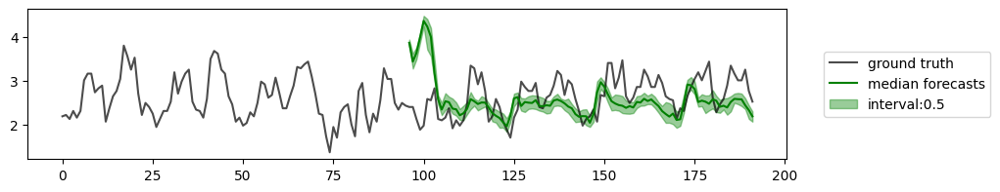

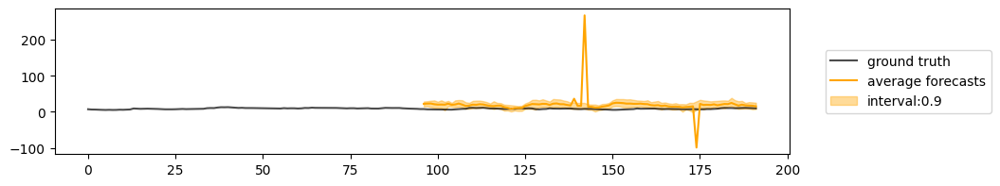

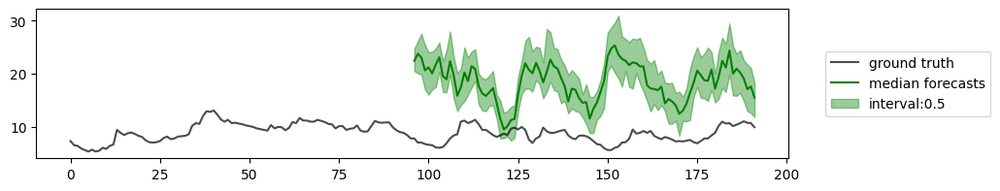

In [87]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DDIM, linear

10


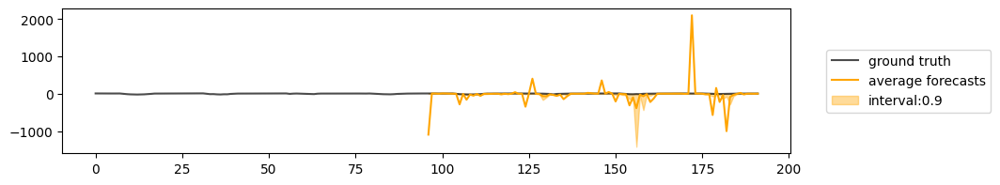

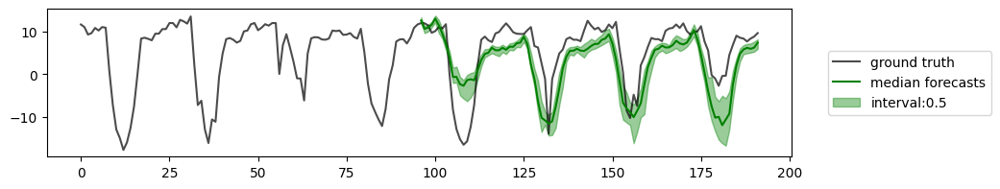

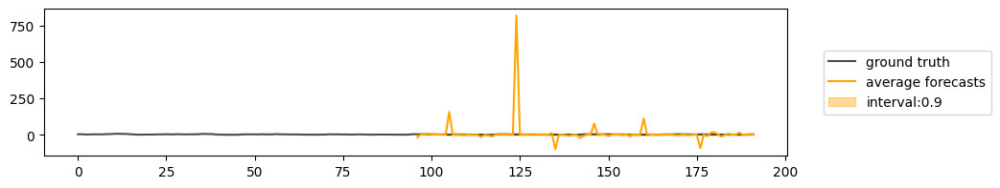

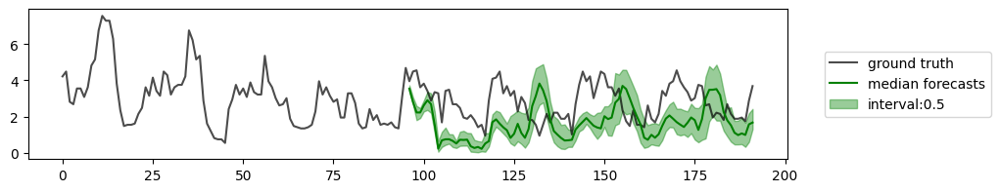

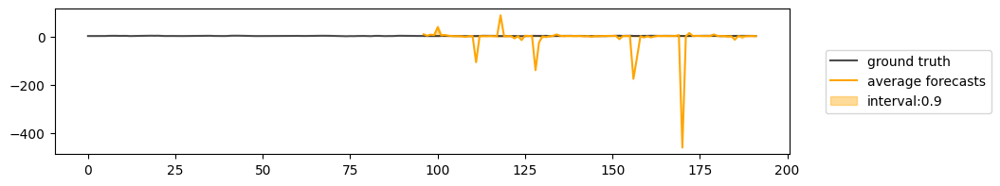

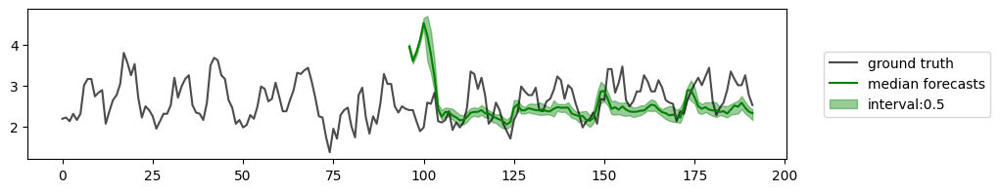

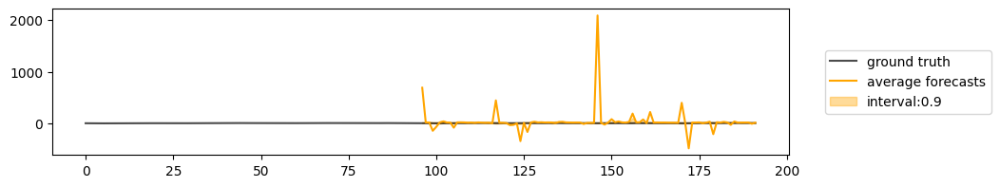

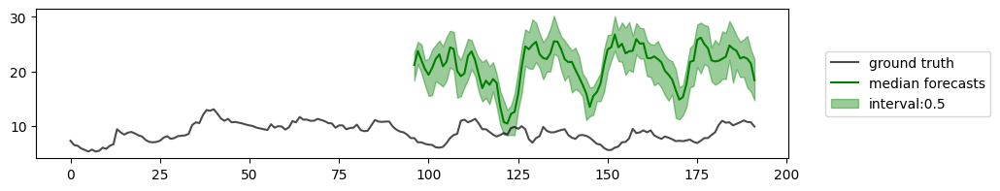

15


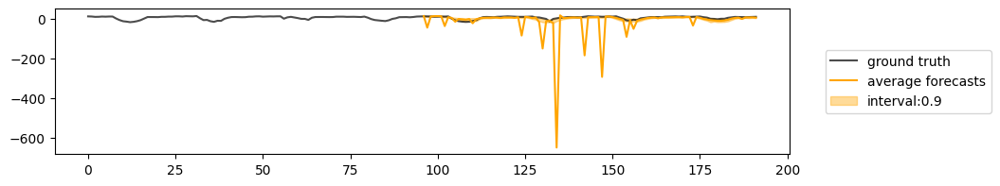

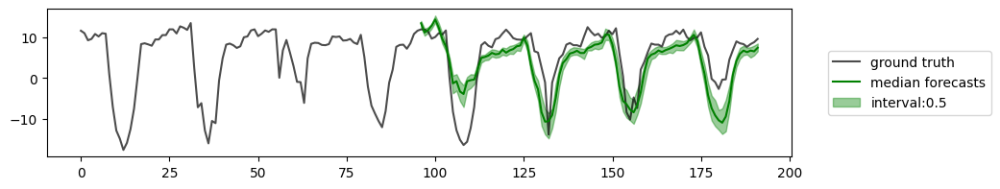

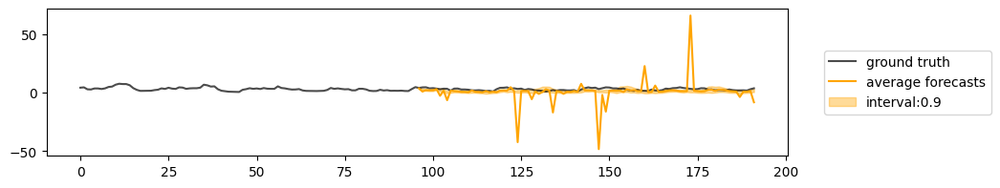

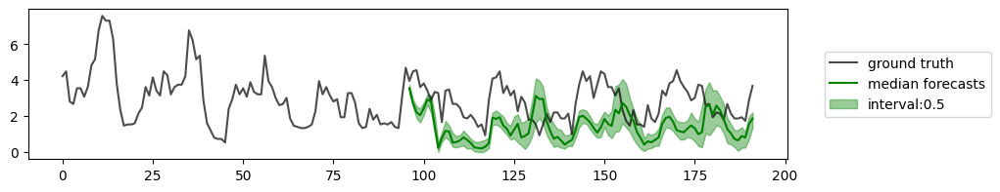

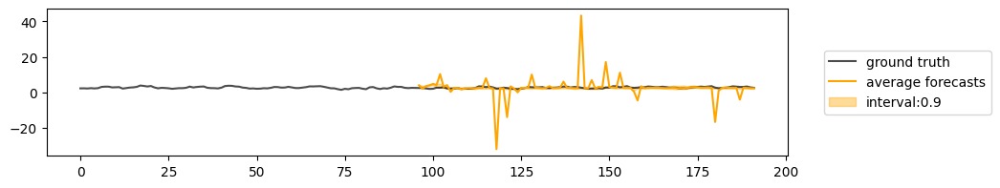

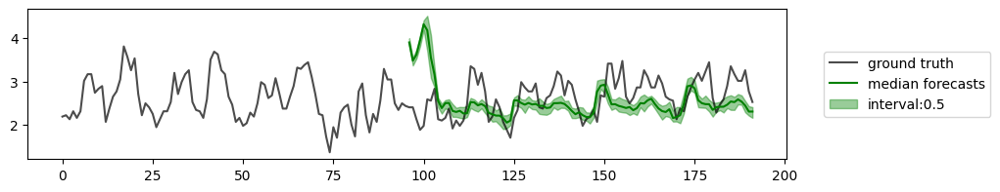

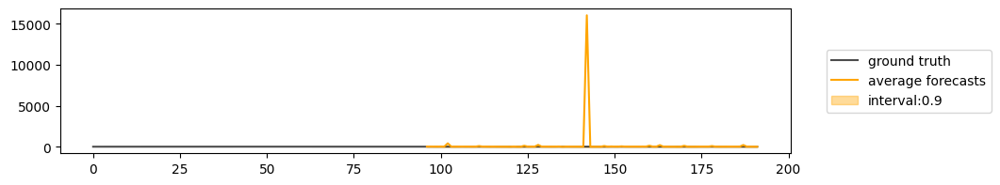

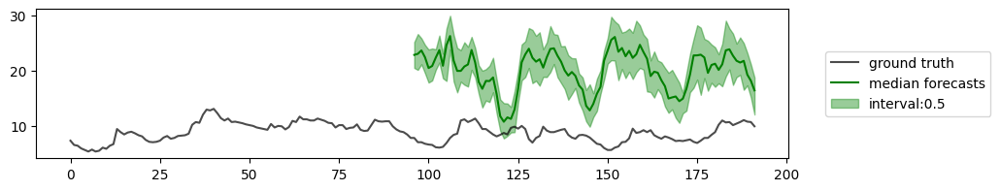

20


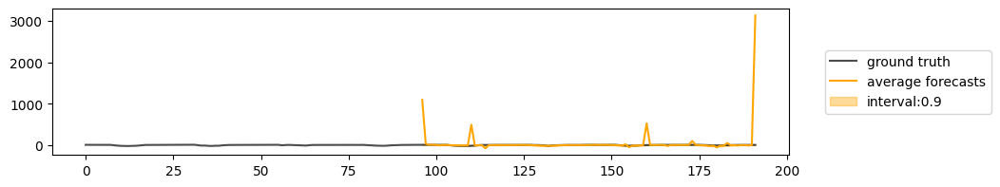

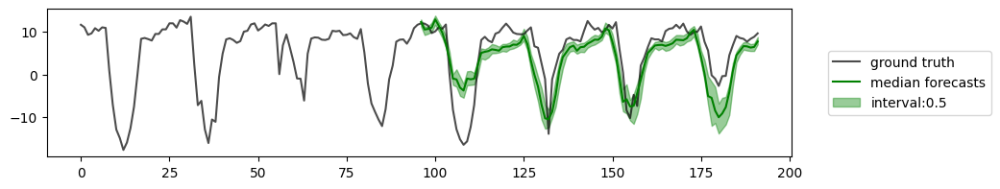

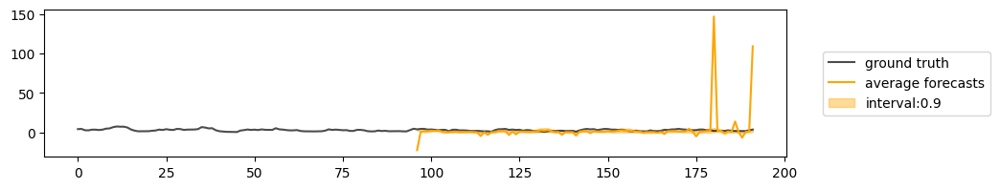

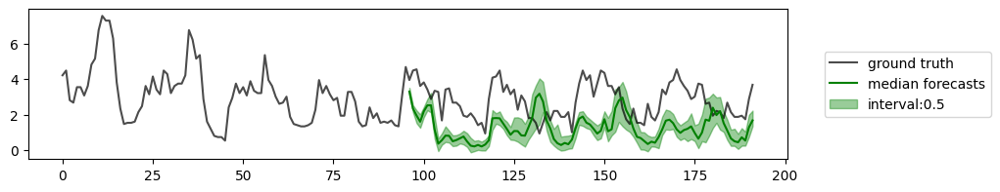

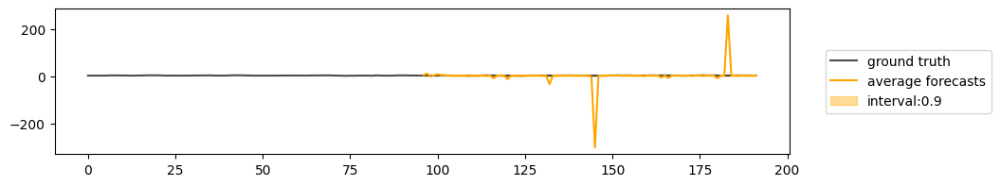

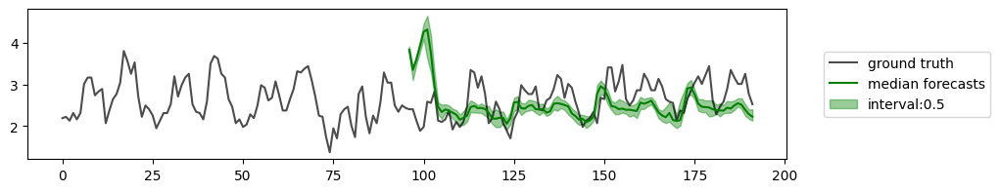

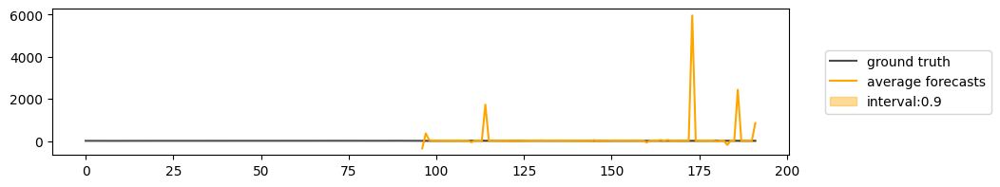

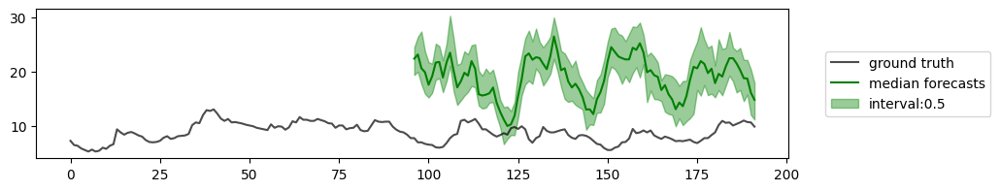

30


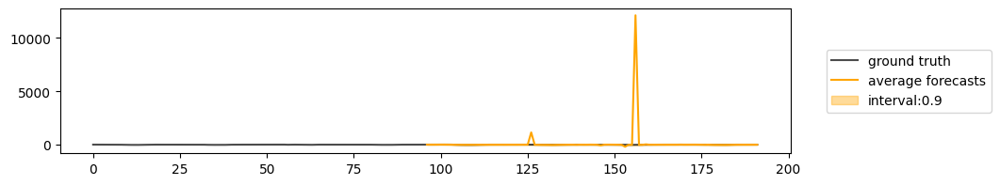

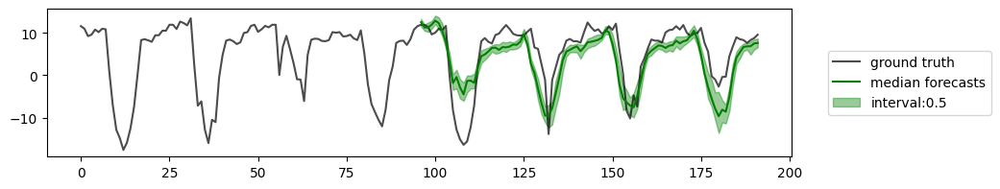

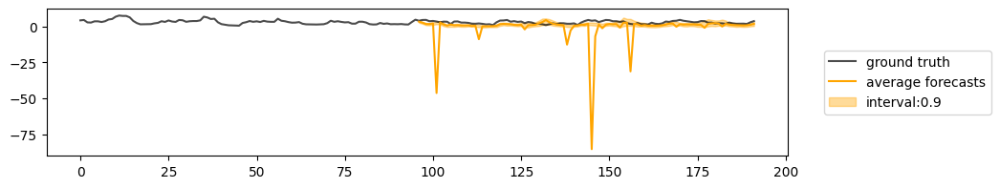

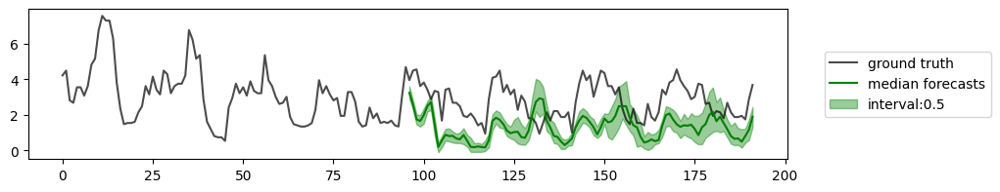

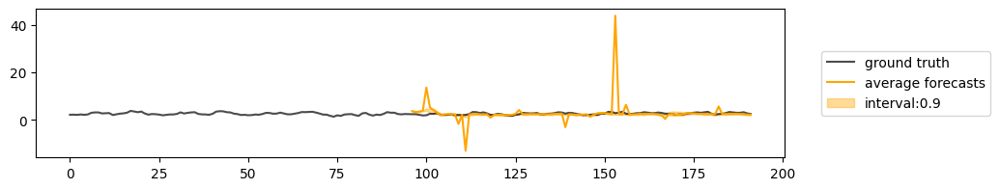

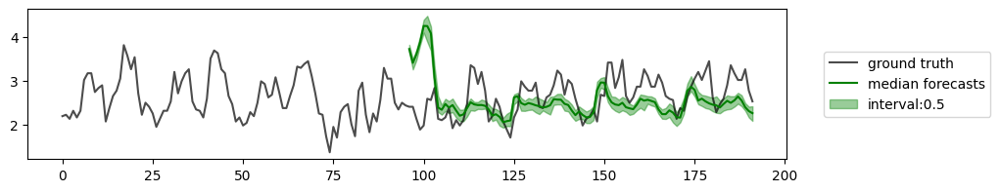

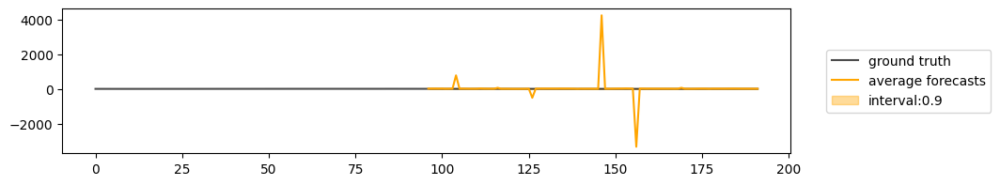

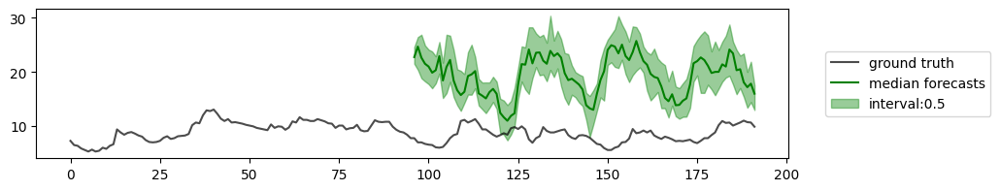

50


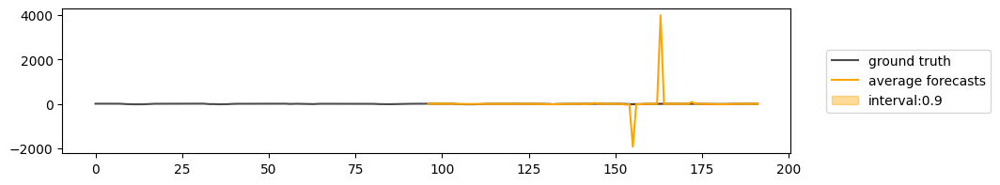

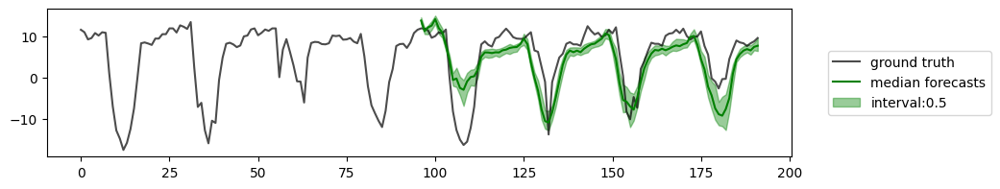

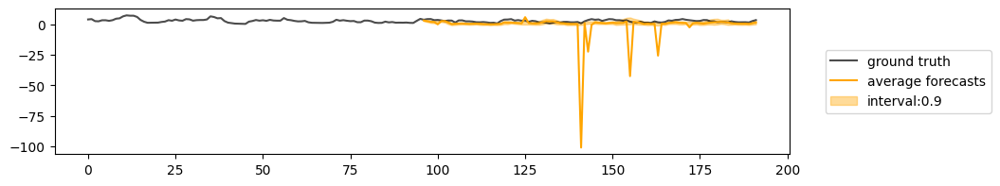

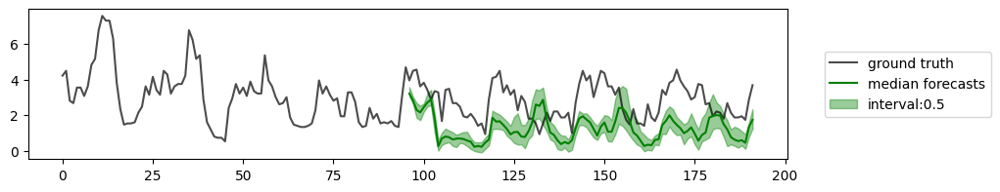

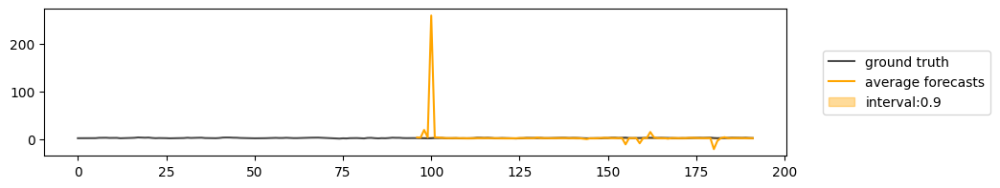

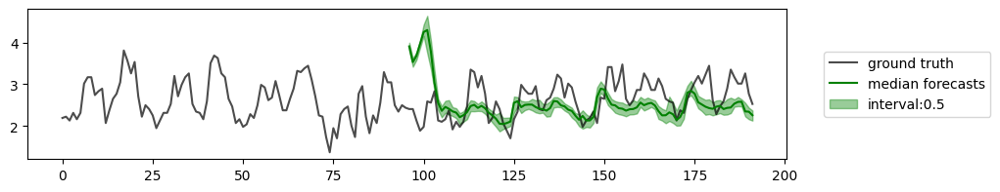

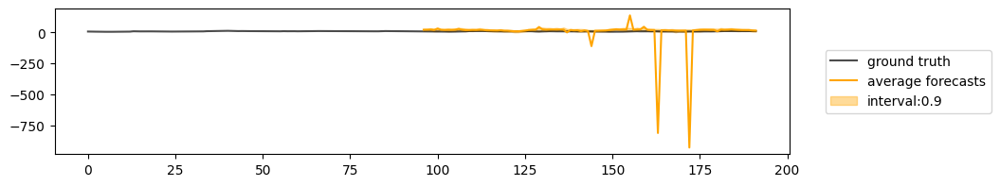

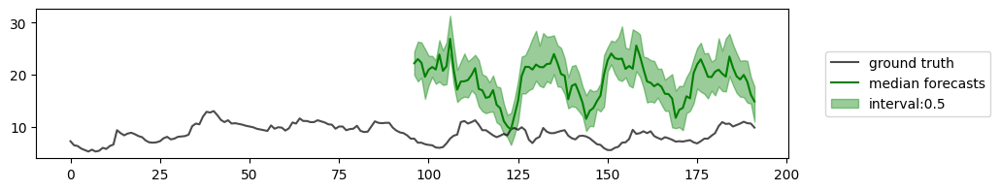

100


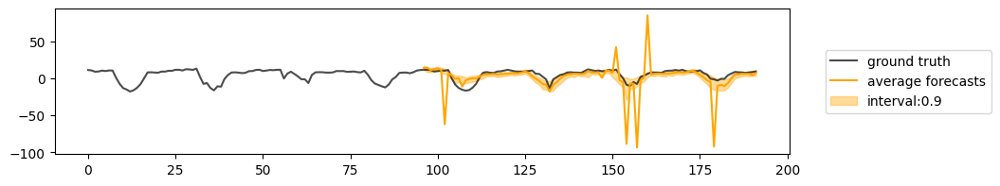

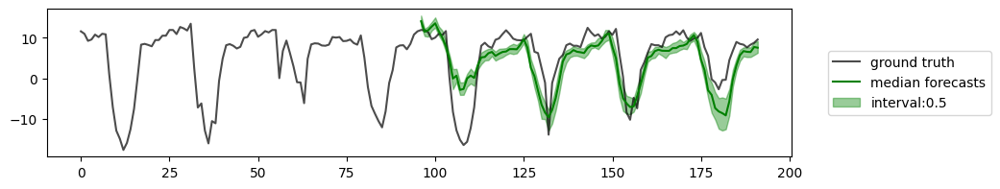

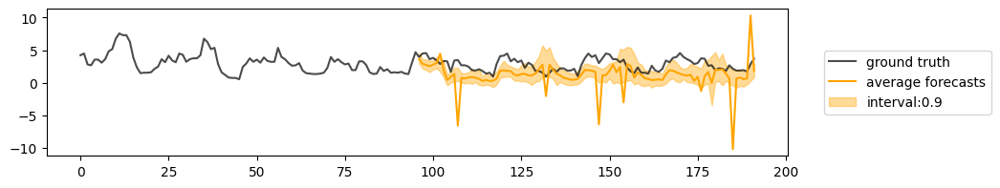

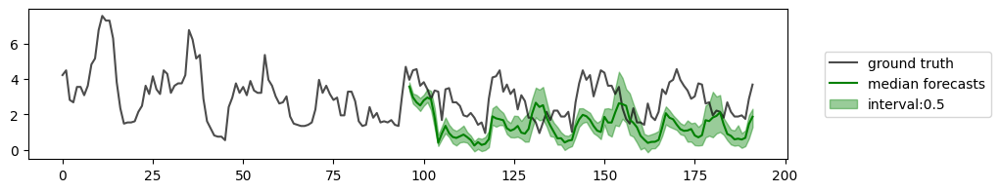

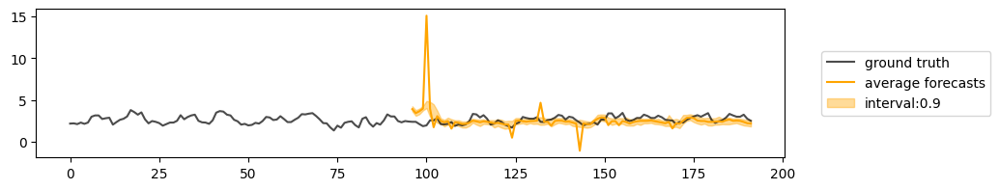

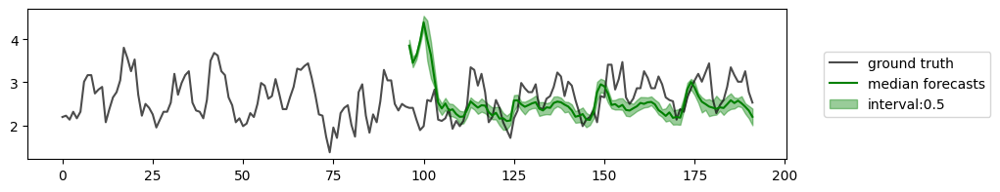

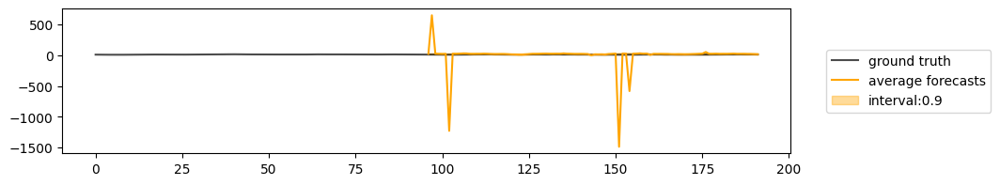

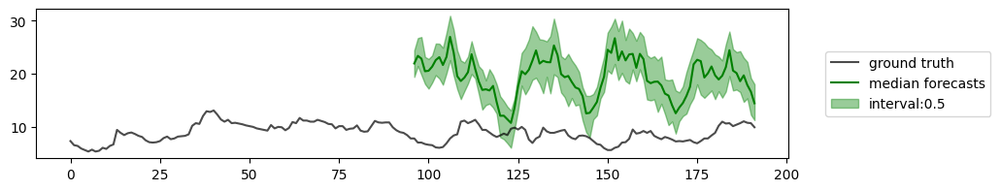

In [88]:
model.forecaster.prob_model.solver_schedule = 'linear'

for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

In [89]:
ddim_linear_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:03, 12.66s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5258982181549072
    96_test_CRPS-Sum        0.35814106464385986
      96_test_MASE           4.815741539001465
       96_test_MSE             221176.359375
     96_test_MSE-Sum            1565115.375
       96_test_ND           0.6415289640426636
     96_test_ND-Sum          0.443280965089798
      96_test_NRMSE           96.895751953125
    96_test_NRMSE-Sum        41.99434280395508
   96_test_weighted_ND      0.6415289640426636
 96_test_weighted_ND-Sum     0.443280965089798
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:29<01:00, 15.01s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5183520317077637
    96_test_CRPS-Sum        0.3449697494506836
      96_test_MASE           4.673199653625488
       96_test_MSE              300973.375
     96_test_MSE-Sum            2050360.125
       96_test_ND           0.6271709203720093
     96_test_ND-Sum         0.4368731677532196
      96_test_NRMSE          72.75029754638672
    96_test_NRMSE-Sum        31.42190170288086
   96_test_weighted_ND      0.6271709203720093
 96_test_weighted_ND-Sum    0.4368731677532196
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:49<00:52, 17.59s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5178722739219666
    96_test_CRPS-Sum        0.34743714332580566
      96_test_MASE           4.597548961639404
       96_test_MSE             171127.796875
     96_test_MSE-Sum            1177500.375
       96_test_ND           0.6230441927909851
     96_test_ND-Sum         0.43968072533607483
      96_test_NRMSE          68.85232543945312
    96_test_NRMSE-Sum       29.004682540893555
   96_test_weighted_ND      0.6230441927909851
 96_test_weighted_ND-Sum    0.43968072533607483
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:18<00:43, 21.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5147379040718079
    96_test_CRPS-Sum        0.3427477777004242
      96_test_MASE           4.571115493774414
       96_test_MSE            38459.19140625
     96_test_MSE-Sum           272002.96875
       96_test_ND            0.61834716796875
     96_test_ND-Sum         0.4340580403804779
      96_test_NRMSE          36.69852066040039
    96_test_NRMSE-Sum       15.778829574584961
   96_test_weighted_ND       0.61834716796875
 96_test_weighted_ND-Sum    0.4340580403804779
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:04<00:30, 30.40s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5126181840896606
    96_test_CRPS-Sum        0.34055936336517334
      96_test_MASE          4.5436787605285645
       96_test_MSE            47359.63671875
     96_test_MSE-Sum            319385.125
       96_test_ND           0.6161126494407654
     96_test_ND-Sum         0.43267661333084106
      96_test_NRMSE          32.91854476928711
    96_test_NRMSE-Sum        13.91372013092041
   96_test_weighted_ND      0.6161126494407654
 96_test_weighted_ND-Sum    0.43267661333084106
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:28<00:00, 34.72s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5106419920921326
    96_test_CRPS-Sum        0.33734193444252014
      96_test_MASE           4.547125339508057
       96_test_MSE             31033.5390625
     96_test_MSE-Sum           214114.484375
       96_test_ND           0.6153039336204529
     96_test_ND-Sum         0.4303719103336334
      96_test_NRMSE          29.0272159576416
    96_test_NRMSE-Sum        12.41024398803711
   96_test_weighted_ND      0.6153039336204529
 96_test_weighted_ND-Sum    0.4303719103336334
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [90]:
with open("ddim_linear_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_linear_metrics, fp)

### DPM-Solver-1

In [91]:
model.forecaster.prob_model.solver = 'dpm1'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [92]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:47<00:00,  7.98s/it]


[2.0606935024261475,
 3.1274361610412598,
 4.189727544784546,
 6.419031143188477,
 10.660873889923096,
 21.412651538848877]

In [93]:
dpm1_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:03, 12.66s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5236266255378723
    96_test_CRPS-Sum        0.35529038310050964
      96_test_MASE           4.789791107177734
       96_test_MSE              198145.3125
     96_test_MSE-Sum            1339971.375
       96_test_ND           0.6394884586334229
     96_test_ND-Sum         0.4393598735332489
      96_test_NRMSE          88.78329467773438
    96_test_NRMSE-Sum       38.102088928222656
   96_test_weighted_ND      0.6394884586334229
 96_test_weighted_ND-Sum    0.4393598735332489
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:29<00:59, 14.90s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5165077447891235
    96_test_CRPS-Sum        0.34295493364334106
      96_test_MASE           4.656461238861084
       96_test_MSE             99077.9921875
     96_test_MSE-Sum            684791.0625
       96_test_ND           0.6255677342414856
     96_test_ND-Sum         0.4372566044330597
      96_test_NRMSE          61.44192886352539
    96_test_NRMSE-Sum       26.029739379882812
   96_test_weighted_ND      0.6255677342414856
 96_test_weighted_ND-Sum    0.4372566044330597
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:49<00:52, 17.39s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5172216892242432
    96_test_CRPS-Sum        0.34776684641838074
      96_test_MASE           4.591762065887451
       96_test_MSE             69911.9296875
     96_test_MSE-Sum             491492.75
       96_test_ND           0.6227734088897705
     96_test_ND-Sum         0.4410962164402008
      96_test_NRMSE          47.40596008300781
    96_test_NRMSE-Sum       20.198633193969727
   96_test_weighted_ND      0.6227734088897705
 96_test_weighted_ND-Sum    0.4410962164402008
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:17<00:43, 21.66s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.513964831829071
    96_test_CRPS-Sum        0.34379419684410095
      96_test_MASE           4.562223434448242
       96_test_MSE             57147.3828125
     96_test_MSE-Sum           398918.21875
       96_test_ND           0.6174798011779785
     96_test_ND-Sum         0.4353455603122711
      96_test_NRMSE          40.88008499145508
    96_test_NRMSE-Sum       17.416526794433594
   96_test_weighted_ND      0.6174798011779785
 96_test_weighted_ND-Sum    0.4353455603122711
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:01<00:29, 29.66s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5128533840179443
    96_test_CRPS-Sum        0.34119555354118347
      96_test_MASE           4.555881023406982
       96_test_MSE            52079.47265625
     96_test_MSE-Sum           346850.96875
       96_test_ND           0.6172717213630676
     96_test_ND-Sum         0.43309712409973145
      96_test_NRMSE         42.533843994140625
    96_test_NRMSE-Sum       18.009967803955078
   96_test_weighted_ND      0.6172717213630676
 96_test_weighted_ND-Sum    0.43309712409973145
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:24<00:00, 34.09s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.510888934135437
    96_test_CRPS-Sum        0.33756133913993835
      96_test_MASE           4.550608158111572
       96_test_MSE            27702.107421875
     96_test_MSE-Sum            176287.3125
       96_test_ND           0.6152782440185547
     96_test_ND-Sum         0.43173864483833313
      96_test_NRMSE         28.971784591674805
    96_test_NRMSE-Sum       11.931995391845703
   96_test_weighted_ND      0.6152782440185547
 96_test_weighted_ND-Sum    0.43173864483833313
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [94]:
with open("dpm1_metrics.pkl", "wb") as fp:
   pickle.dump(dpm1_metrics, fp)

10


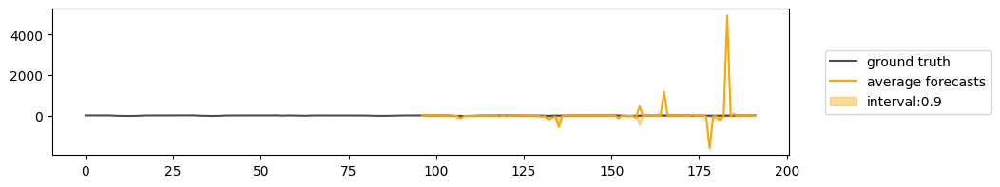

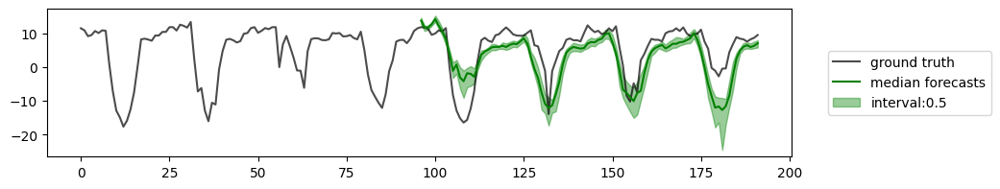

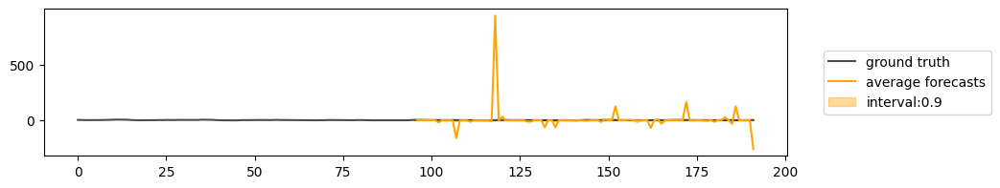

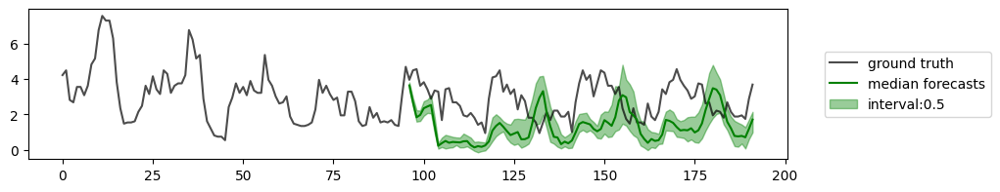

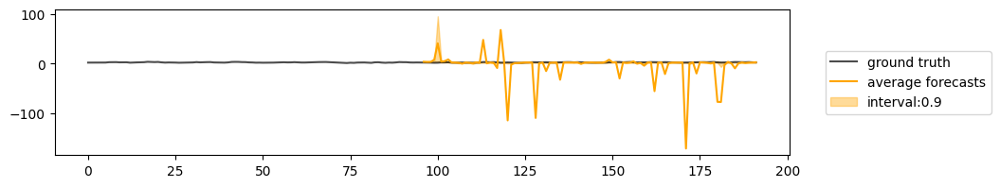

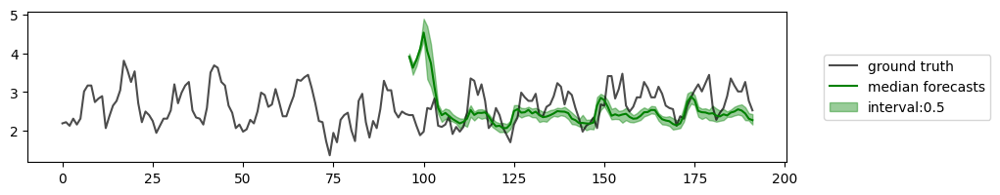

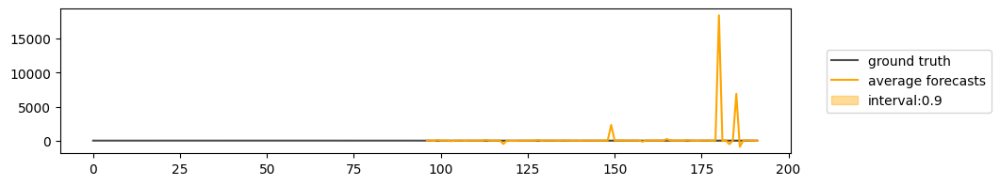

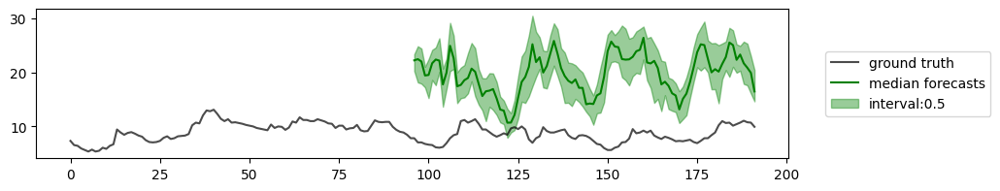

15


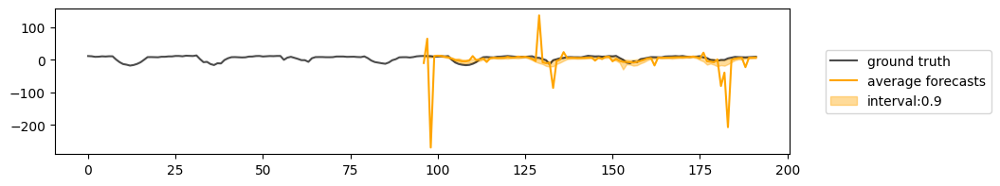

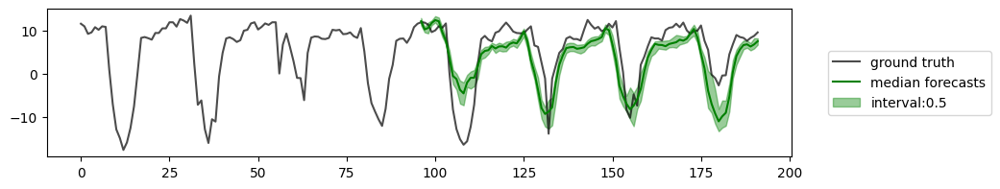

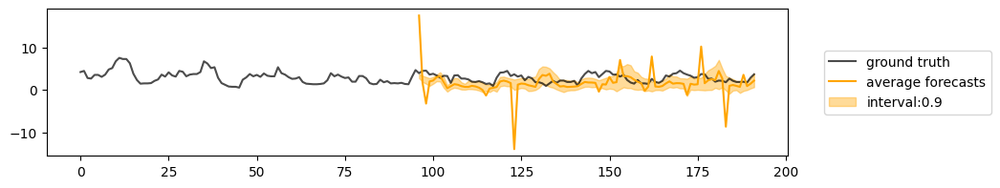

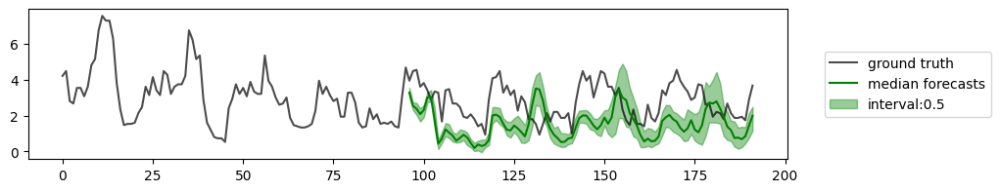

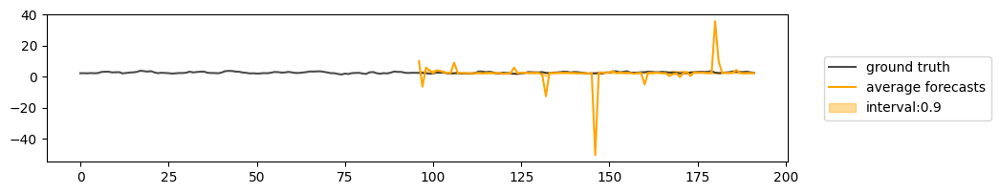

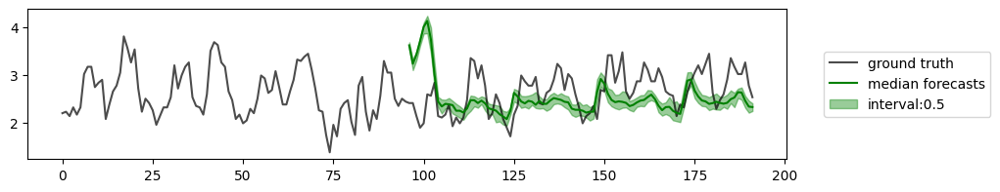

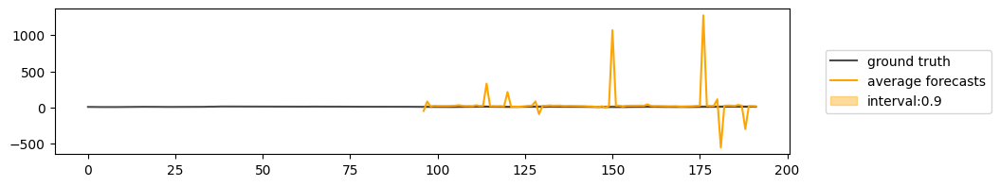

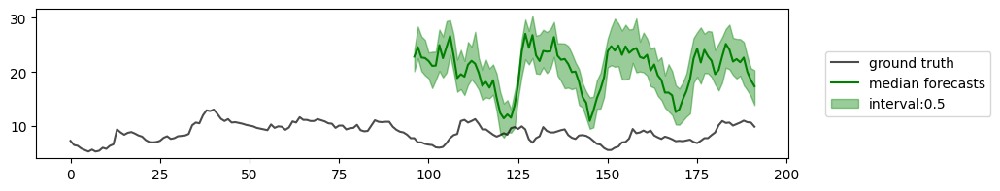

20


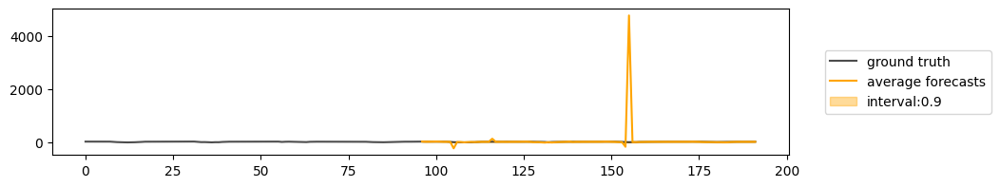

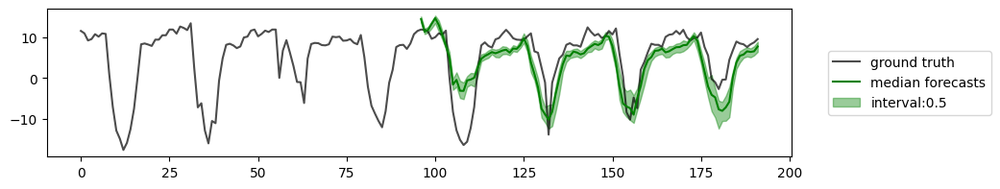

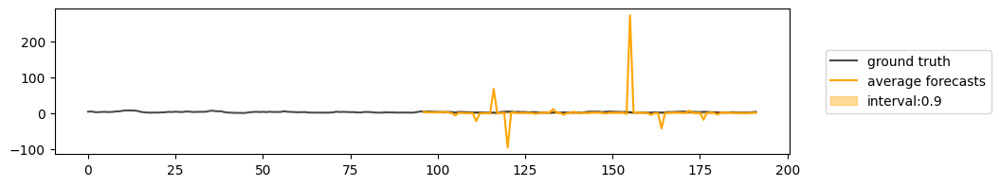

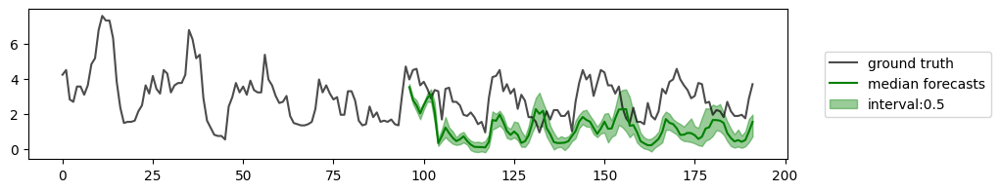

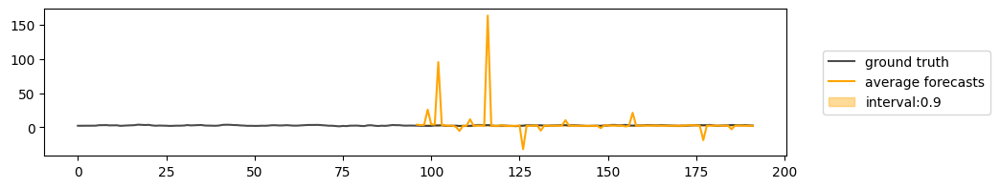

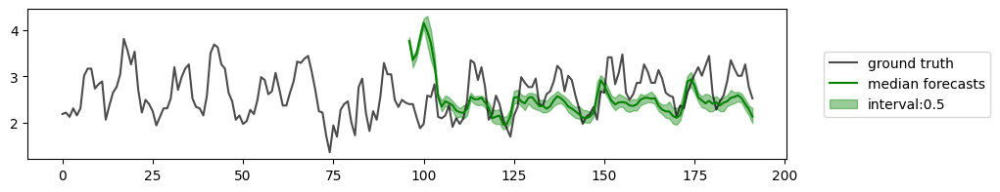

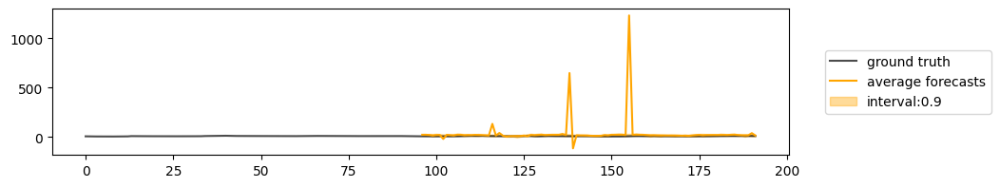

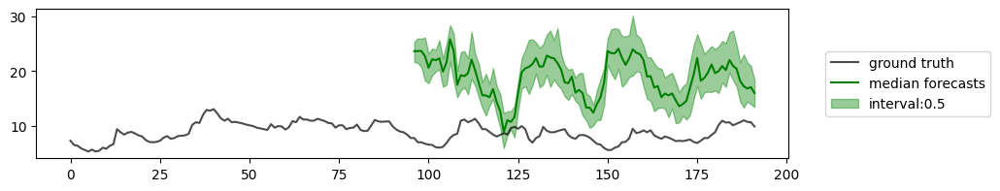

30


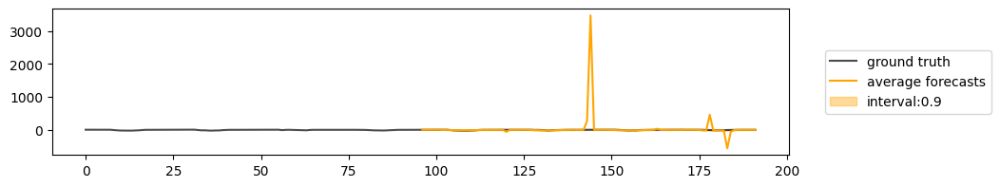

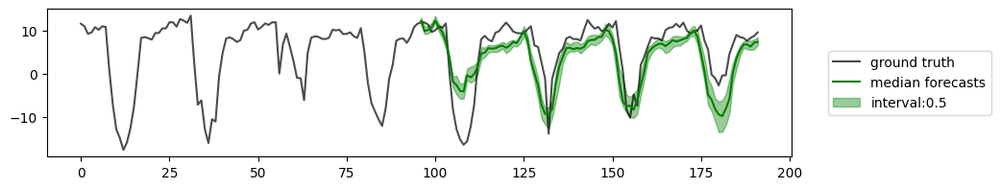

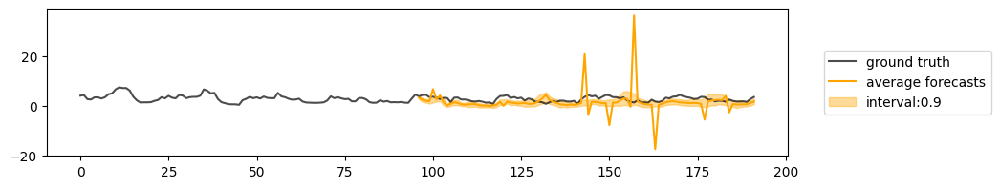

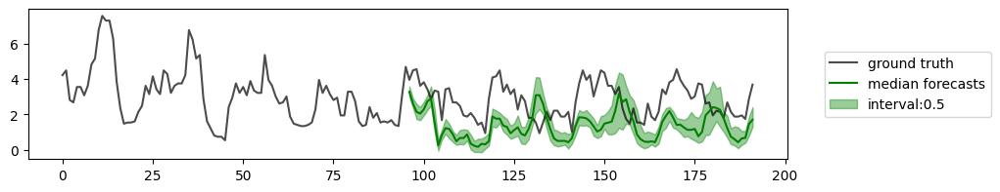

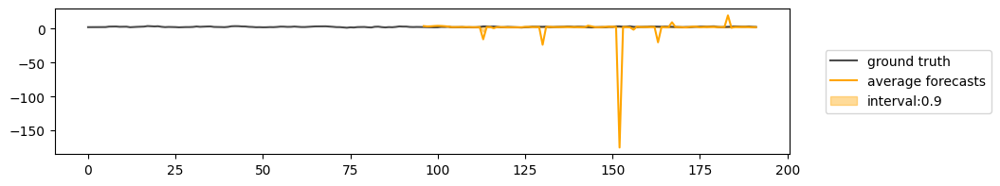

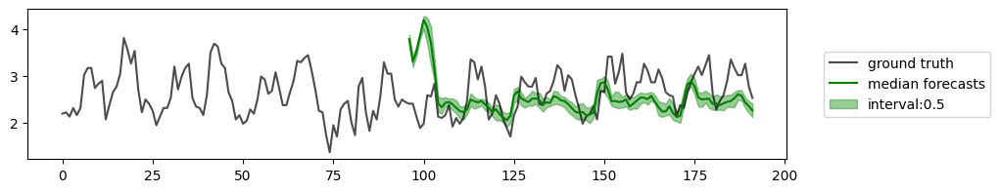

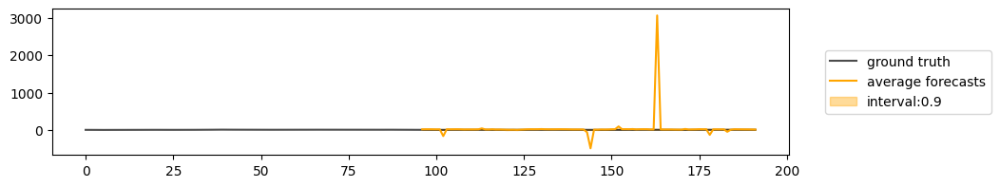

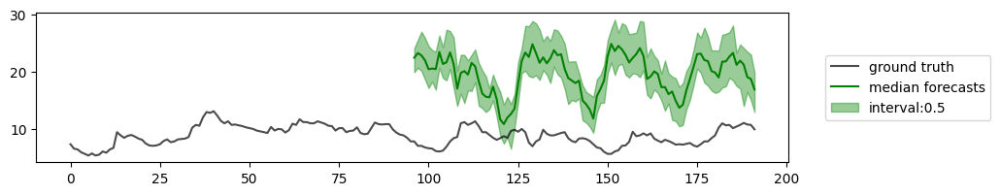

50


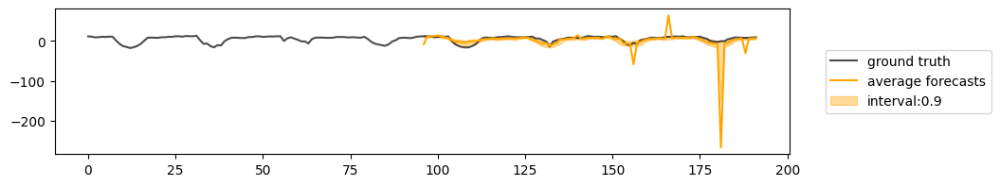

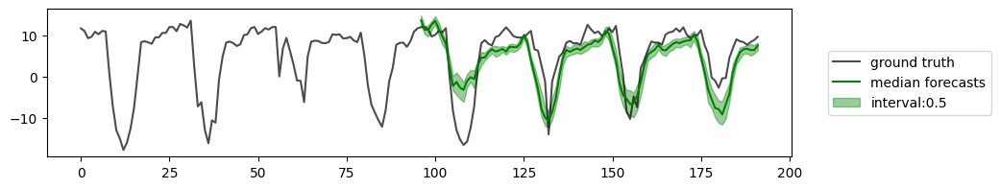

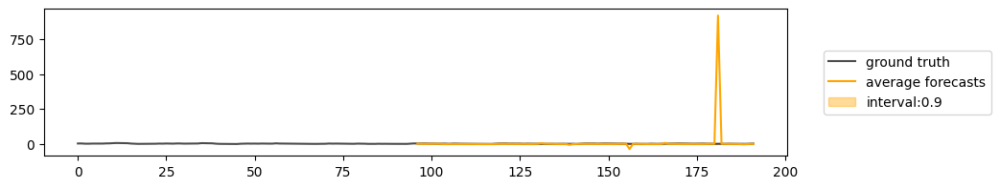

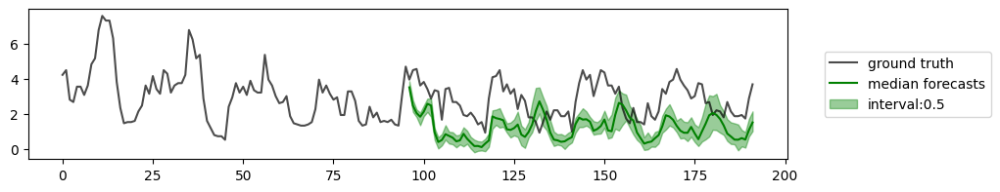

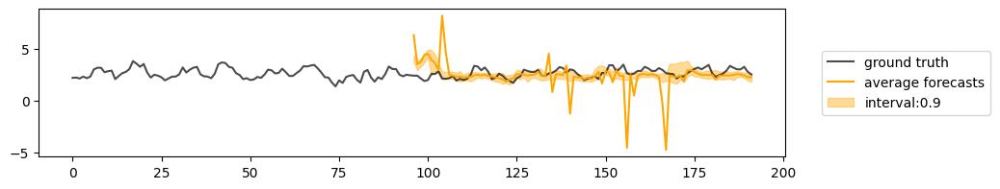

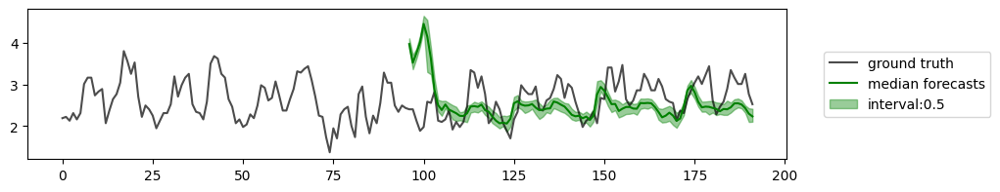

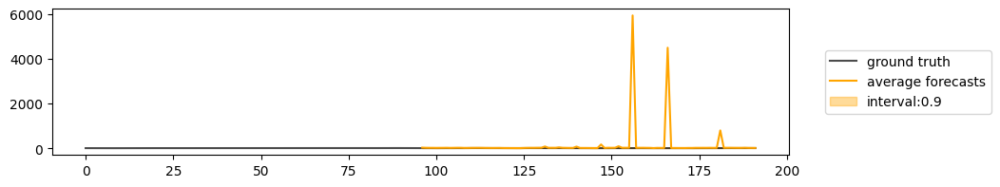

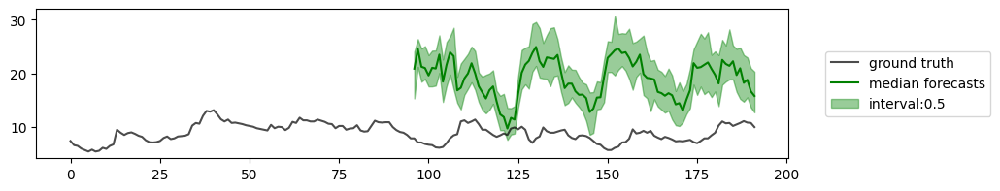

100


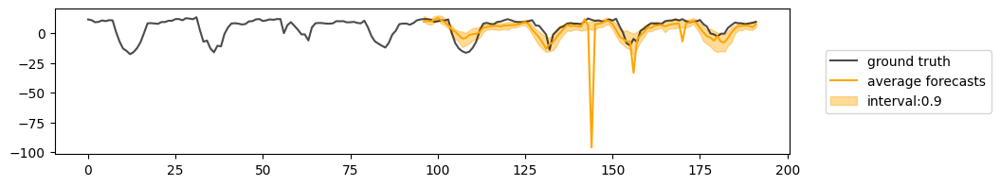

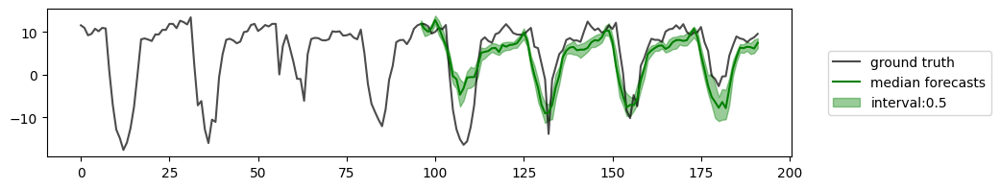

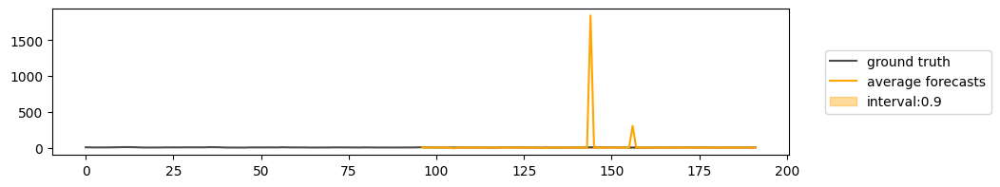

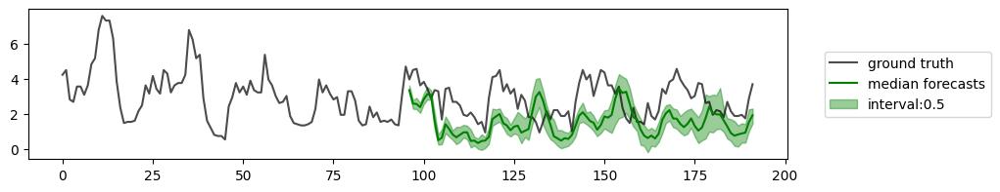

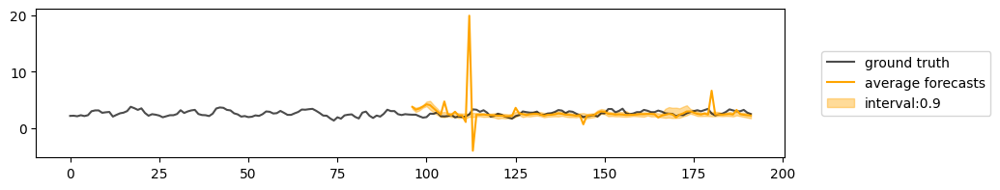

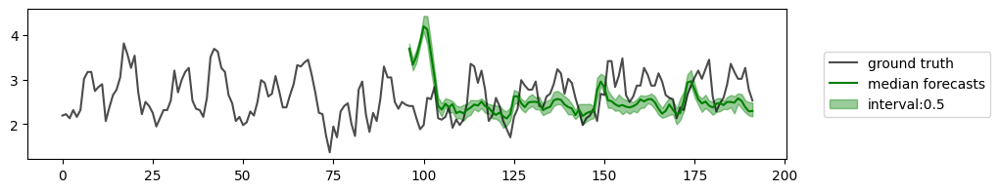

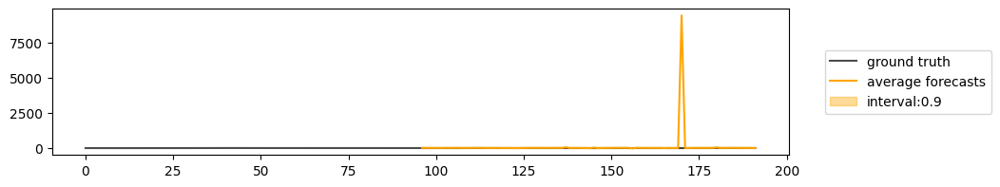

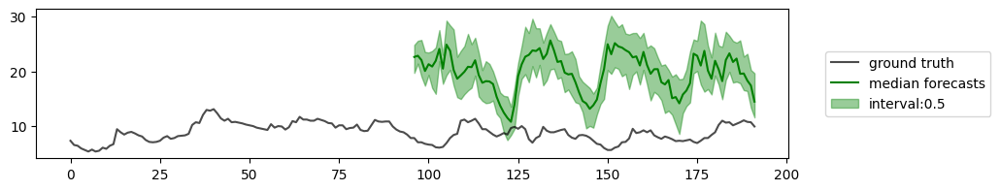

In [95]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### DPM-Solver-2

In [96]:
model.forecaster.prob_model.solver = 'dpm2'

In [97]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:47<00:00,  8.00s/it]


[1.8899691104888916,
 2.7833080291748047,
 4.139873504638672,
 6.374750137329102,
 10.802705764770508,
 21.984424352645874]

In [98]:
dpm2_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:12<01:00, 12.16s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS            11296.900390625
    96_test_CRPS-Sum         7463.30029296875
      96_test_MASE              72510.03125
       96_test_MSE             9586251776.0
     96_test_MSE-Sum           67107913728.0
       96_test_ND             8516.6337890625
     96_test_ND-Sum          6289.80029296875
      96_test_NRMSE           19599.10546875
    96_test_NRMSE-Sum         8736.7216796875
   96_test_weighted_ND        8516.6337890625
 96_test_weighted_ND-Sum     6289.80029296875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [00:27<00:56, 14.01s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.9962859153747559
    96_test_CRPS-Sum        0.7381024360656738
      96_test_MASE          10.577790260314941
       96_test_MSE            9165.388671875
     96_test_MSE-Sum          63534.26953125
       96_test_ND           1.1901154518127441
     96_test_ND-Sum         0.9412192106246948
      96_test_NRMSE         16.838964462280273
    96_test_NRMSE-Sum       7.0916643142700195
   96_test_weighted_ND      1.1901154518127441
 96_test_weighted_ND-Sum    0.9412192106246948
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [00:47<00:50, 16.89s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.48098427057266235
    96_test_CRPS-Sum        0.29956313967704773
      96_test_MASE           4.402937889099121
       96_test_MSE            39212.67578125
     96_test_MSE-Sum            271729.4375
       96_test_ND           0.5918586850166321
     96_test_ND-Sum         0.3939136862754822
      96_test_NRMSE         21.800514221191406
    96_test_NRMSE-Sum        9.187475204467773
   96_test_weighted_ND      0.5918586850166321
 96_test_weighted_ND-Sum    0.3939136862754822
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [01:16<00:42, 21.44s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.5067934393882751
    96_test_CRPS-Sum        0.32582491636276245
      96_test_MASE           4.562779426574707
       96_test_MSE           5913.23291015625
     96_test_MSE-Sum           27724.9765625
       96_test_ND            0.616069495677948
     96_test_ND-Sum          0.425297349691391
      96_test_NRMSE         11.860776901245117
    96_test_NRMSE-Sum        4.472901344299316
   96_test_weighted_ND       0.616069495677948
 96_test_weighted_ND-Sum     0.425297349691391
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [02:00<00:29, 29.78s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.4924885034561157
    96_test_CRPS-Sum        0.3173852264881134
      96_test_MASE           4.438499927520752
       96_test_MSE             85955.6640625
     96_test_MSE-Sum             593668.75
       96_test_ND            0.601735532283783
     96_test_ND-Sum         0.41484132409095764
      96_test_NRMSE          42.25798034667969
    96_test_NRMSE-Sum       18.154626846313477
   96_test_weighted_ND       0.601735532283783
 96_test_weighted_ND-Sum    0.41484132409095764
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [03:25<00:00, 34.33s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.54756760597229
    96_test_CRPS-Sum        0.37899288535118103
      96_test_MASE           4.553075313568115
       96_test_MSE          464.68133544921875
     96_test_MSE-Sum          3238.3525390625
       96_test_ND           0.6193941235542297
     96_test_ND-Sum         0.4418201148509979
      96_test_NRMSE         2.6215343475341797
    96_test_NRMSE-Sum        1.149603247642517
   96_test_weighted_ND      0.6193941235542297
 96_test_weighted_ND-Sum    0.4418201148509979
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [99]:
import pickle
with open("dpm2_metrics.pkl", "wb") as fp:
   pickle.dump(dpm2_metrics, fp)

10


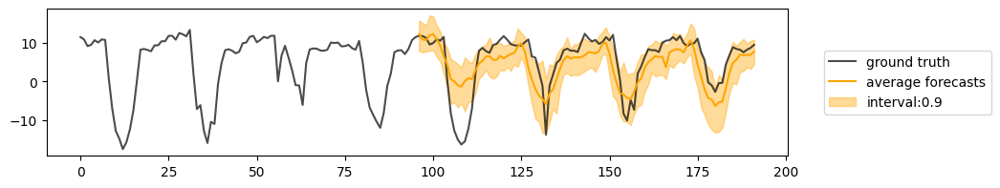

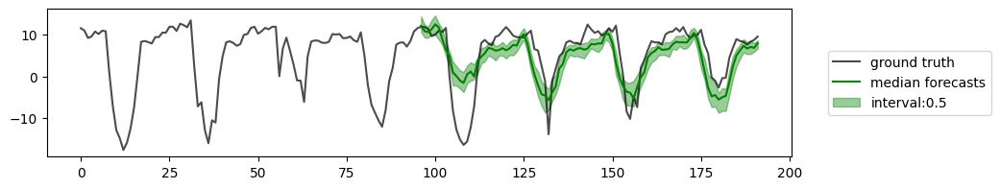

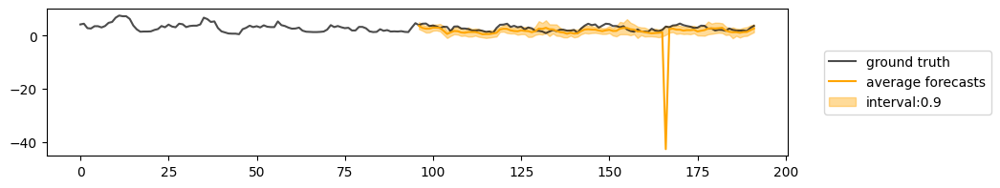

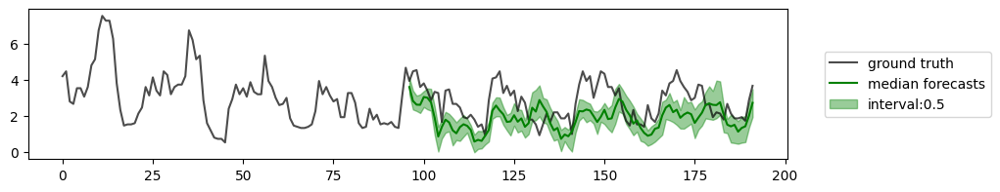

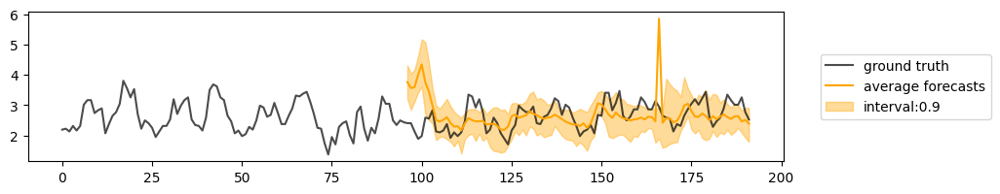

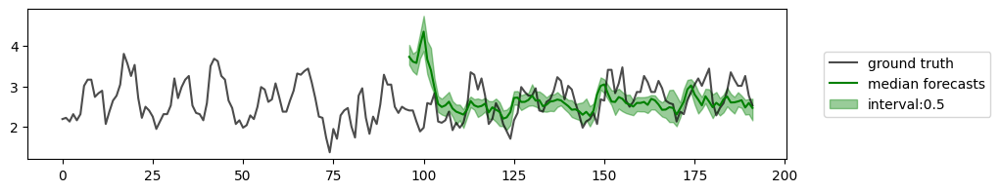

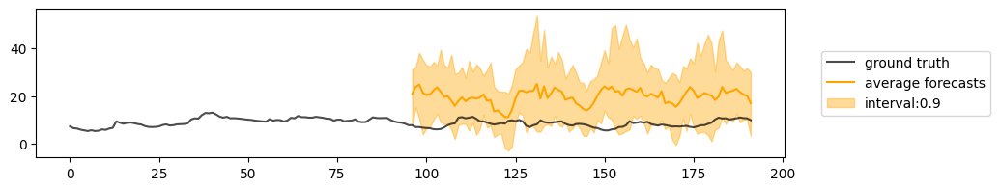

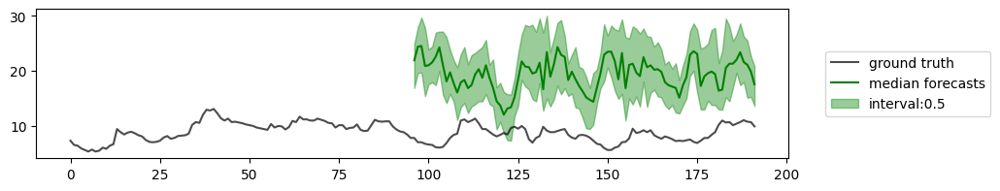

15


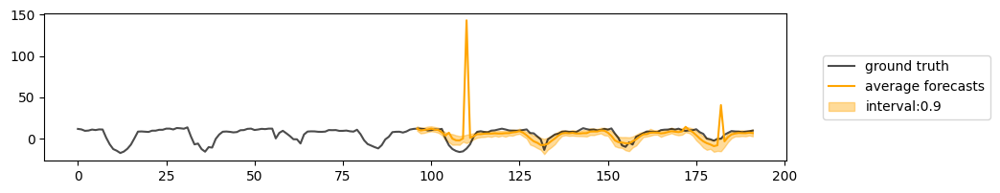

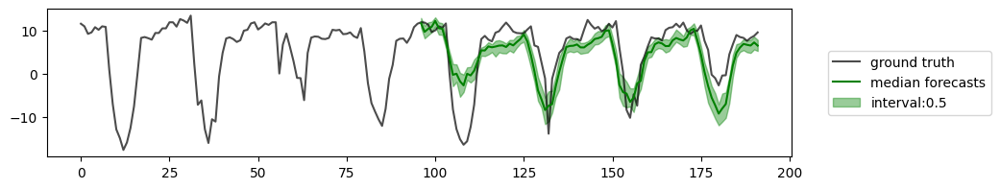

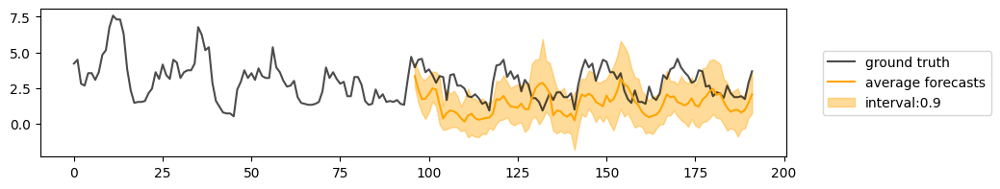

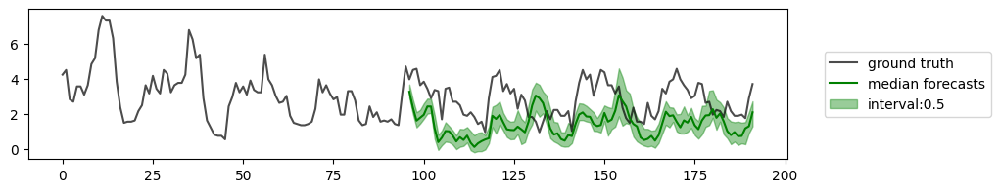

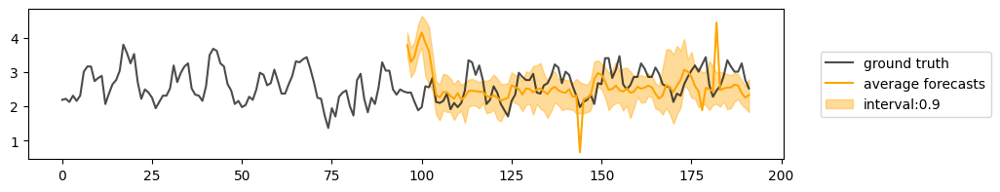

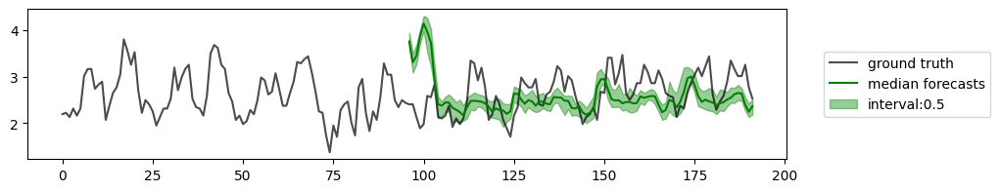

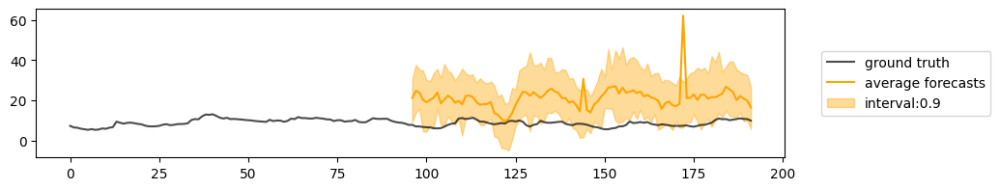

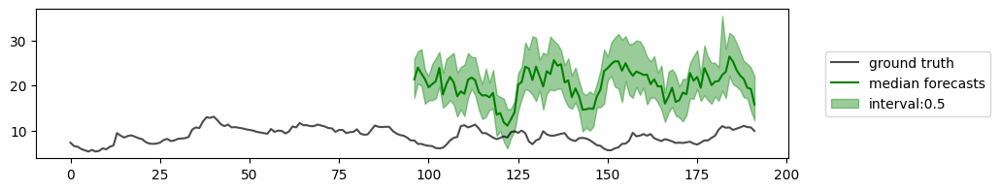

20


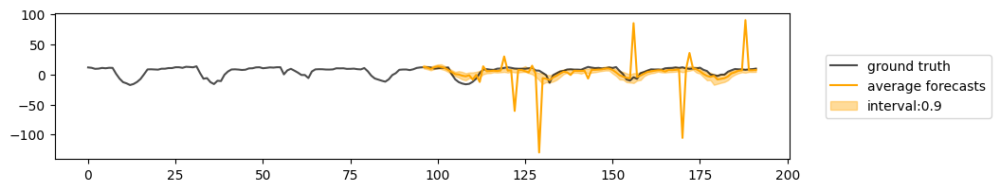

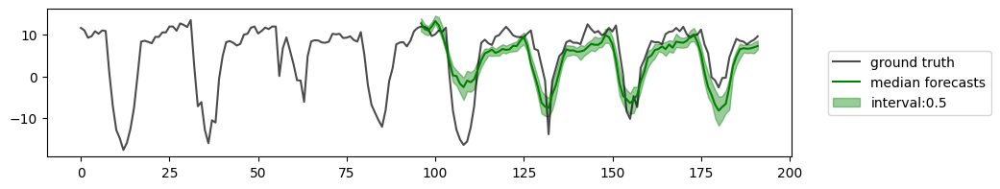

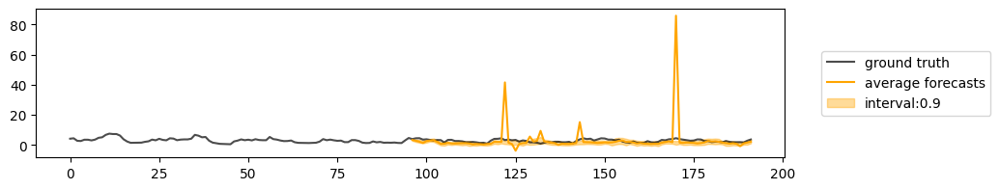

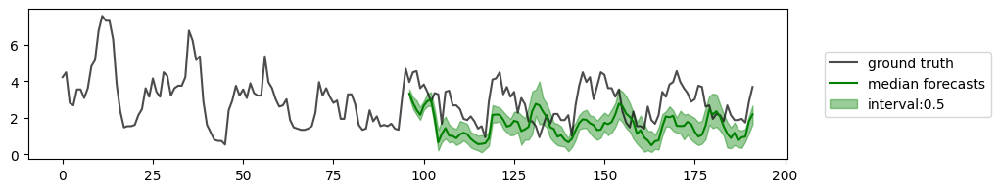

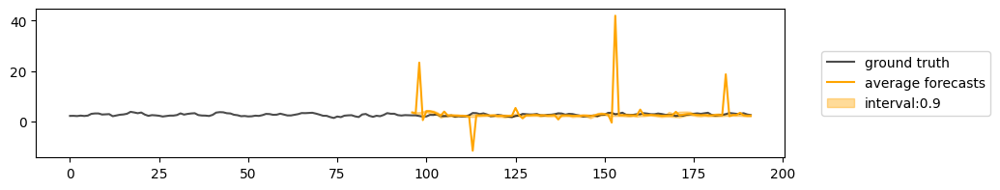

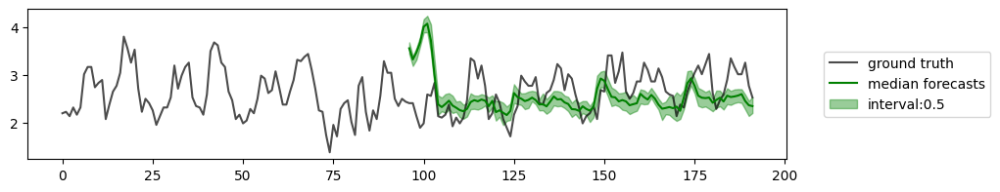

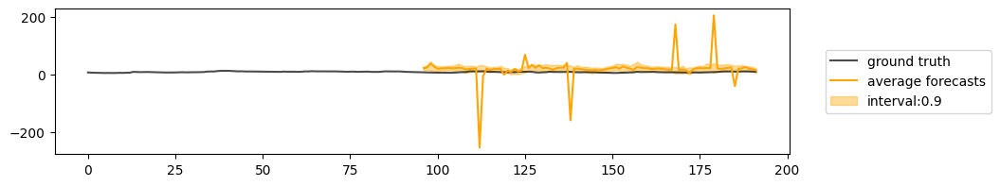

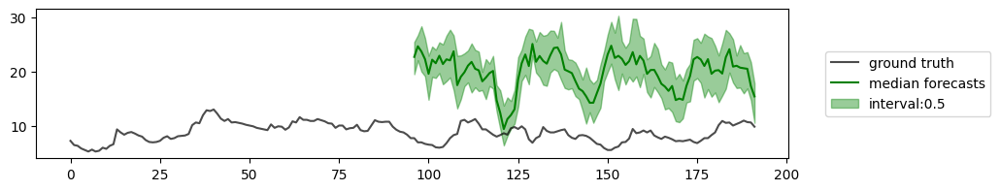

30


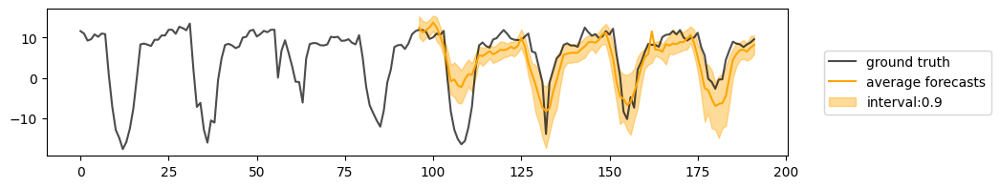

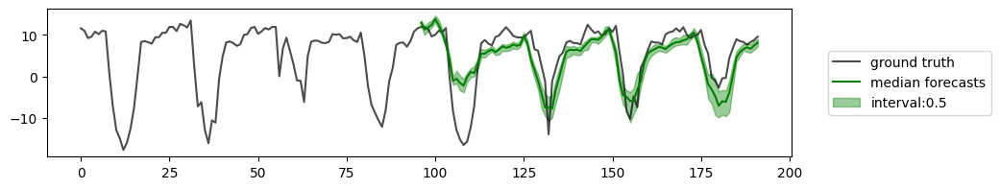

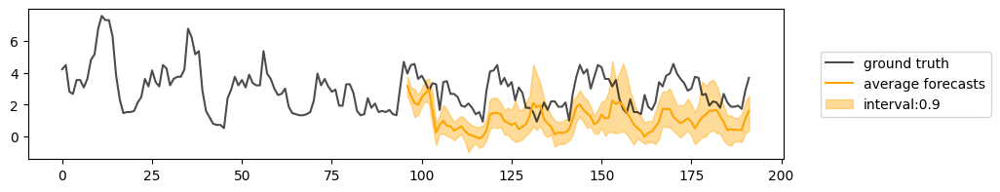

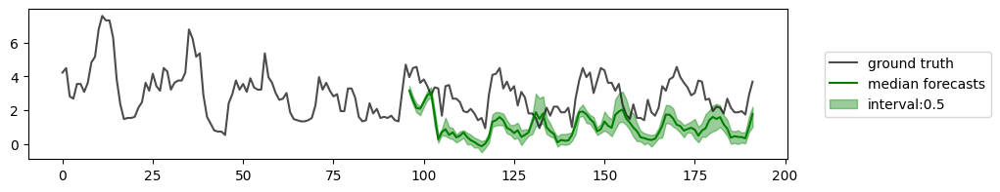

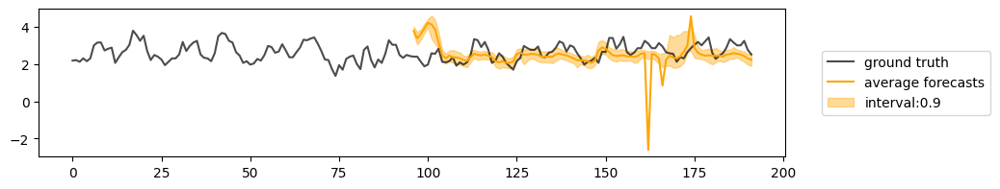

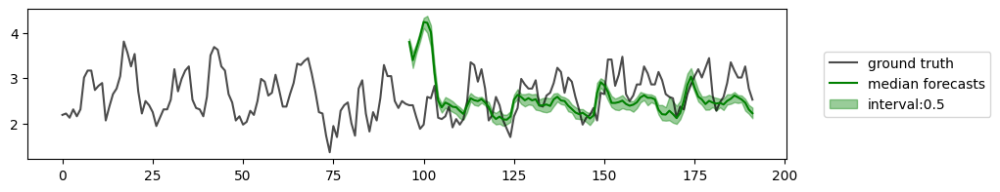

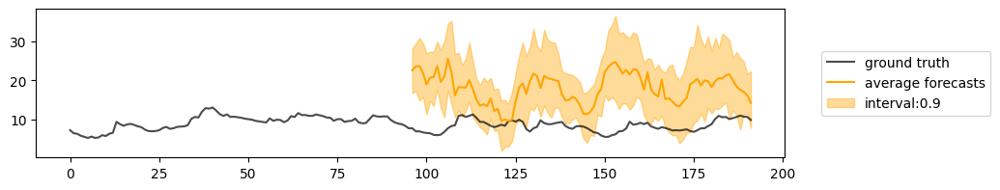

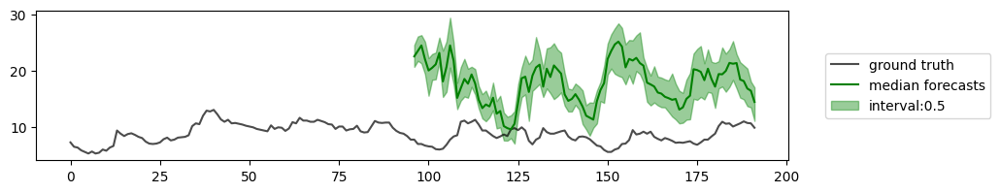

50


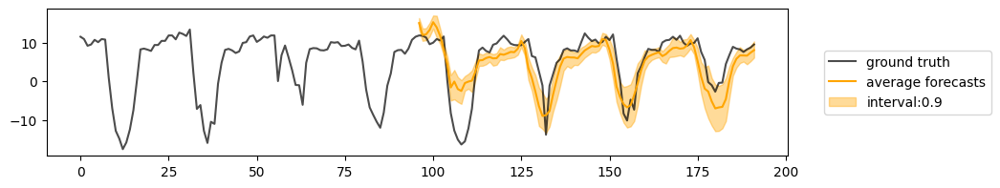

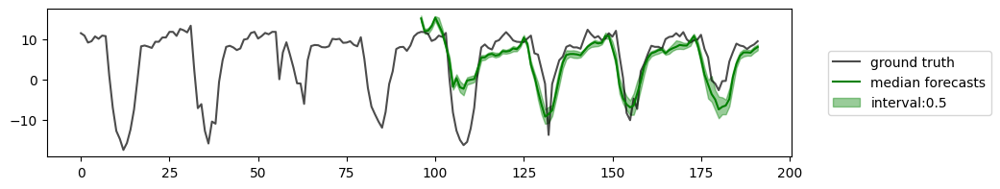

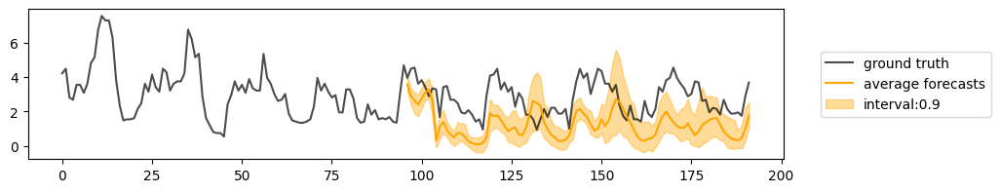

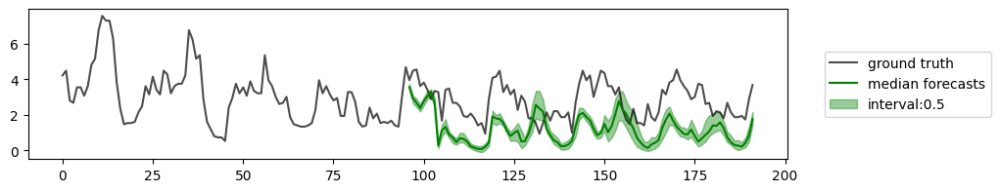

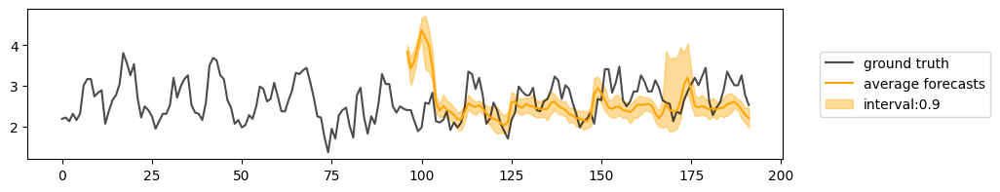

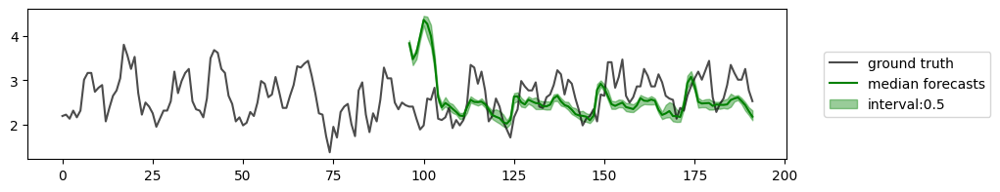

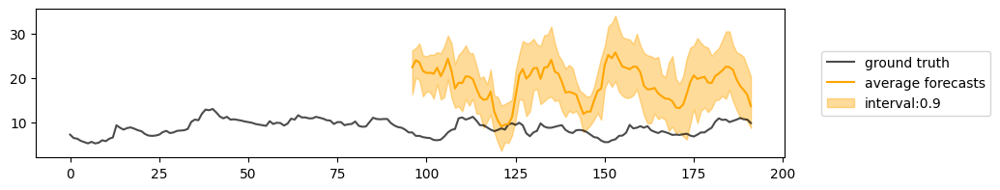

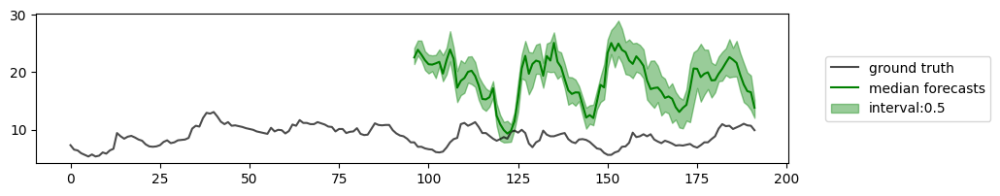

100


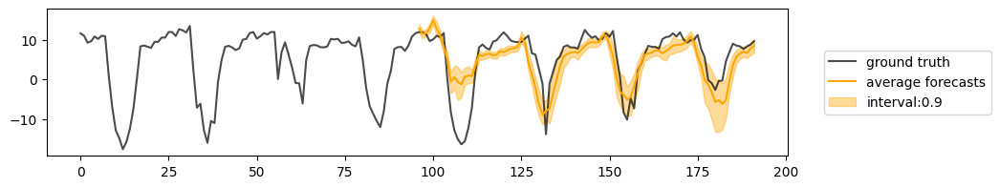

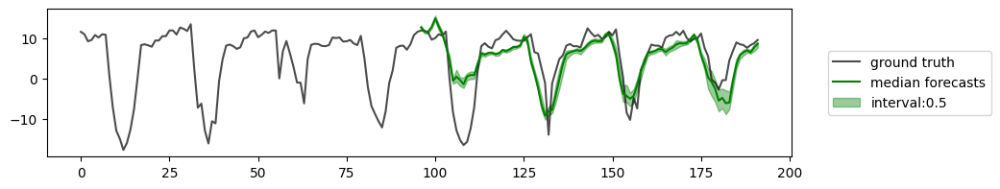

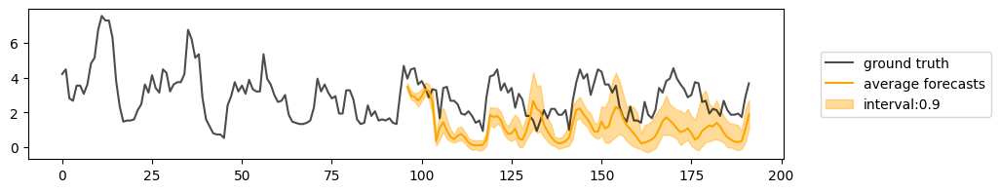

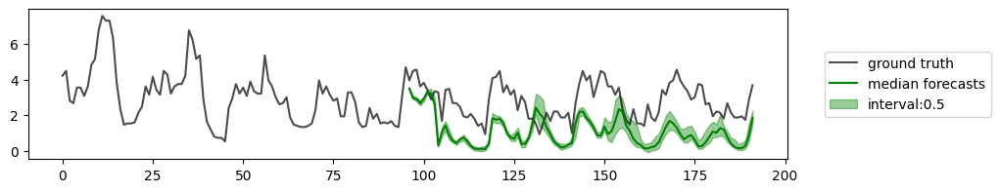

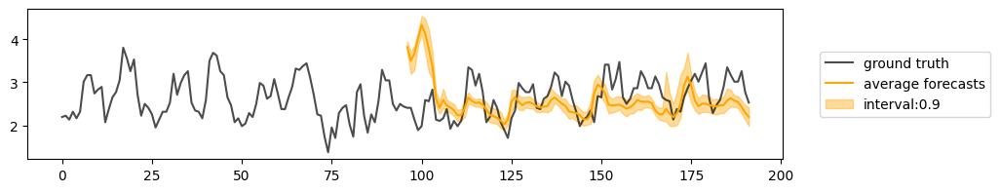

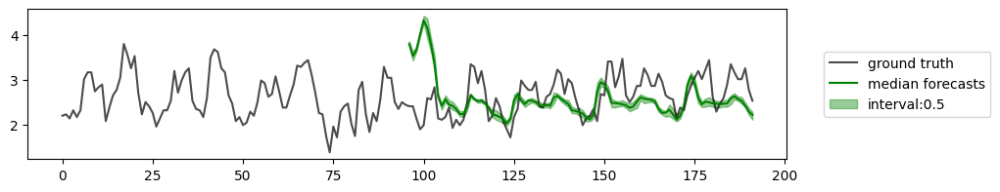

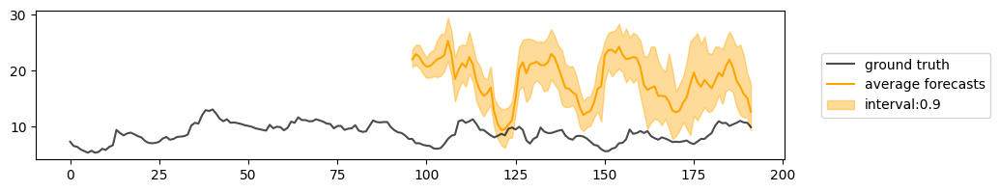

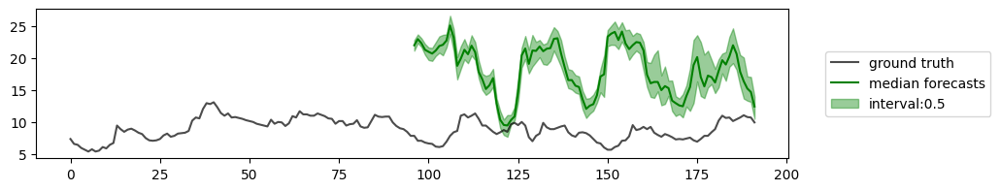

In [100]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 4, 6], num_samples=50, batch_idx=4, context_length=96, prediction_length=96)
    plt.show()

### Plot results

In [101]:
import pickle
import os

metrics = {}
samplers_name = ['DDIM, linear', 'DDIM, quad', 'DPM-Solver-1', 'DPM-Solver-2', 'Euler', 'Heun']
i = 0
for file in sorted(os.listdir("samplers_res/")):
    if 'pkl' not in file:
        continue
    with open(f"samplers_res/{file}", "rb") as fp:
        metrics[samplers_name[i]] = pickle.load(fp)
    i += 1

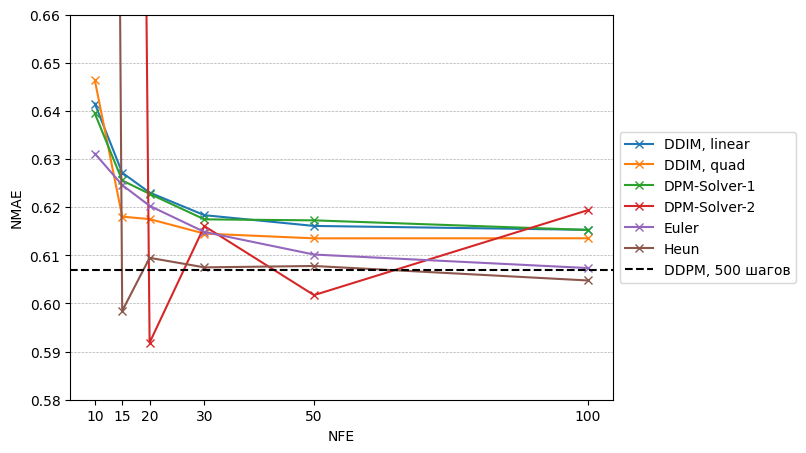

In [104]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    plt.plot(nfe, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.6068617701530457 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.58, 0.66)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

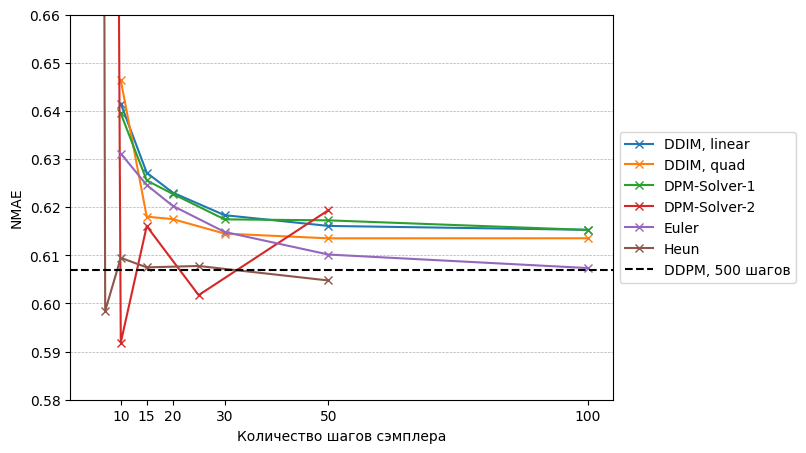

In [105]:
solver_steps = [10, 15, 20, 30, 50, 100]
solver_steps_2ord = [step // 2 for step in solver_steps]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, nmae, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.6068617701530457 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.58, 0.66)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

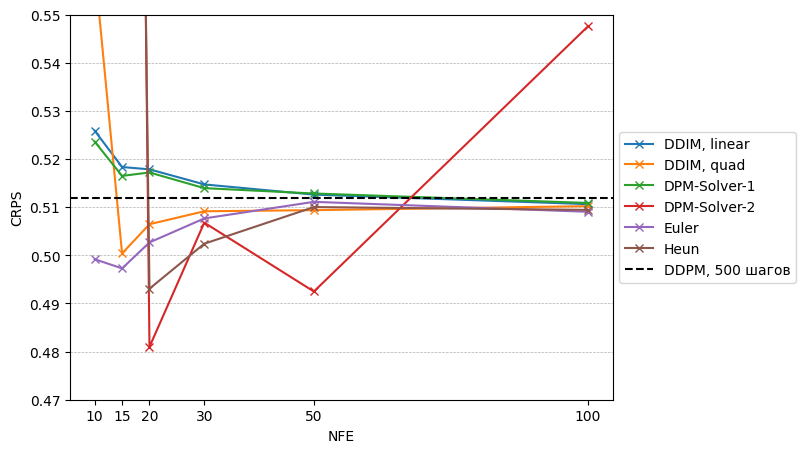

In [107]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    plt.plot(nfe, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.5118424892425537, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.47, 0.55)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

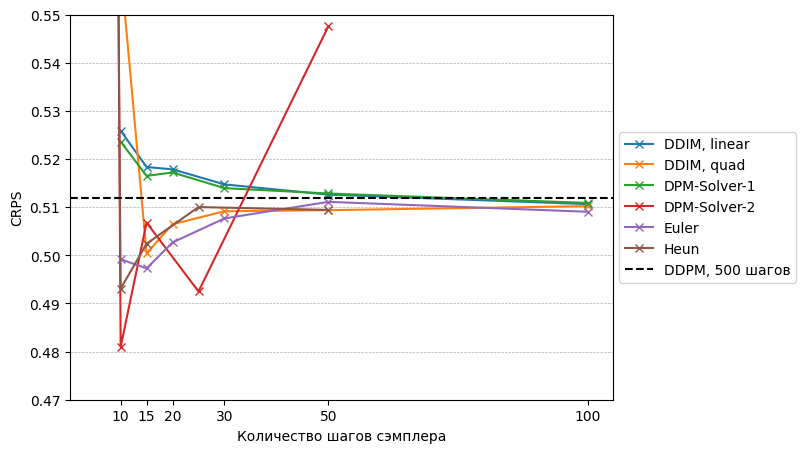

In [108]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, crps, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.5118424892425537, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.47, 0.55)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));